# Proyecto 2 MDD
Por Alejandro Ide Figueroa.

- Este trabajo parte con una limpieza de datos y luego con su posterior tratamiento de datos por medio de distintos modelos de clasificacion.


dataset en kaggle: https://www.kaggle.com/datasets/rabieelkharoua/students-performance-dataset

## INICIO

In [46]:
# Importando los modulos a usar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# import plotly.express as px

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_curve, auc, ConfusionMatrixDisplay
from yellowbrick.classifier import ConfusionMatrix
from sklearn.model_selection import GridSearchCV
from sklearn.tree import plot_tree
#from sklearn.metrics import r2_score
#from sklearn.metrics import mean_absolute_error, mean_squared_error

In [47]:
# Leer y mostrar los datos del CSV
# Asegúrate de que el archivo "SP_Data.csv" esté en el mismo directorio que este script
df = pd.read_csv("SP_Data.csv")
df.head()

,StudentID,Age,Gender,Ethnicity,ParentalEducation,StudyTimeWeekly,Absences,Tutoring,ParentalSupport,Extracurricular,Sports,Music,Volunteering,GPA,GradeClass
0,1001,17,1,0,2,19.833723,7,1,2,0,0,1,0,2.929196,2.0
1,1002,18,0,0,1,15.408756,0,0,1,0,0,0,0,3.042915,1.0
2,1003,15,0,2,3,4.210570,26,0,2,0,0,0,0,0.112602,4.0
3,1004,17,1,0,3,10.028829,14,0,3,1,0,0,0,2.054218,3.0
4,1005,17,1,0,2,4.672495,17,1,3,0,0,0,0,1.288061,4.0


#### Comprobar el GPA

In [48]:
# Comprobar que GradeClass corresponde al GPA según la tabla dada
def calcular_grade_class(gpa):
    if gpa >= 3.5:
        return 0
    elif gpa >= 3.0:
        return 1
    elif gpa >= 2.5:
        return 2
    elif gpa >= 2.0:
        return 3
    else:
        return 4

# Aplicar la función al GPA y comparar con GradeClass
grade_class_calculado = df['GPA'].apply(calcular_grade_class)
diferencias = (grade_class_calculado != df['GradeClass']).sum()

print(f"Número de filas donde GradeClass no corresponde al GPA: {diferencias}")
if diferencias > 0:
    print(df.loc[grade_class_calculado != df['GradeClass'], ['GPA', 'GradeClass']].head())
else:
    print("Todos los valores de GradeClass corresponden correctamente al GPA.")

Número de filas donde GradeClass no corresponde al GPA: 168
           GPA  GradeClass
2176  3.137624         3.0
2177  3.189217         2.0
2178  1.795369         3.0
2179  2.435958         4.0
2181  1.844056         1.0


## EDA

Análisis de los datos en primera instancia

### ¿Qué significa cada una de las columnas?

<ul>
    <li><strong>Age</strong> → Edad del estudiante.</li>
    <li><strong>Gender</strong> → Genero.</li>
    <li><strong>Ethnicity</strong> → De donde proviene el estudiante.</li>
    <li><strong>ParentalEducation</strong> → Nivel educacional de los padres.</li>
    <li><strong>StudyTimeWeekly</strong> → Horas de estudios semanales del estudiante.</li>
    <li><strong>Absences</strong> → Ausencias a clases.</li>
    <li><strong>Tutoring</strong> → Va o no a tutorias.</li>
    <li><strong>ParentalSuppor</strong> → Nivel de ayuda que tiene de sus padres.</li>
    <li><strong>Extracurricular</strong> → Participa o no de actividades extracurriculares.</li>
    <li><strong>Sport</strong> → Participa o no de actividades relacionadas al deportes.</li>
    <li><strong>Music</strong> → Participa o no de actividades relacionadas a la musica.</li>
    <li><strong>Volunteering</strong> → Participa o no de activiadades de voluntariado.</li>
    <li><strong>GPA</strong> → Puntaje de Nota Promedio del estudiante.</li>
    <li><strong>GradeClass</strong> → Clase en que queda el estudiante según el GPA.</li>
</ul>

### Análisis de datos perdidos y duplicados

Esta parte del primer análisis es importante ya que dataset con este tipo de datos puede llevar a que se forme un resultado erroneo

#### Datos perdidos

In [49]:
df.isna().sum()

StudentID            0
Age                  0
Gender               0
Ethnicity            0
ParentalEducation    0
StudyTimeWeekly      0
Absences             0
Tutoring             0
ParentalSupport      0
Extracurricular      0
Sports               0
Music                0
Volunteering         0
GPA                  0
GradeClass           0
dtype: int64

En este caso **no** se encontraron datos perdidos y todos los datos son números enteros (int) o números racionales (float)

#### Datos duplicados

In [50]:
print(df.duplicated().sum())

0


**Tampoco** se encontraron datos duplicados

### Descriptores generales

Son valores importantes a calcular del set de datos cantidad, media, desviación estandar, minimo, maximo, quartiles.

Tambien se buscaran el tipo de valor y los posibles valores que estos atributos pueden tomar.

In [51]:
df.describe()

,StudentID,Age,Gender,Ethnicity,ParentalEducation,StudyTimeWeekly,Absences,Tutoring,ParentalSupport,Extracurricular,Sports,Music,Volunteering,GPA,GradeClass
count,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000
mean,2196.500000,16.468645,0.510870,0.877508,1.746237,9.771992,14.541388,0.301421,2.122074,0.383361,0.303512,0.196906,0.157191,1.906186,2.983696
std,690.655244,1.123798,0.499986,1.028476,1.000411,5.652774,8.467417,0.458971,1.122813,0.486307,0.459870,0.397744,0.364057,0.915156,1.233908
min,1001.000000,15.000000,0.000000,0.000000,0.000000,0.001057,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1598.750000,15.000000,0.000000,0.000000,1.000000,5.043079,7.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.174803,2.000000
50%,2196.500000,16.000000,1.000000,0.000000,2.000000,9.705363,15.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.893393,4.000000
75%,2794.250000,17.000000,1.000000,2.000000,2.000000,14.408410,22.000000,1.000000,3.000000,1.000000,1.000000,0.000000,0.000000,2.622216,4.000000
max,3392.000000,18.000000,1.000000,3.000000,4.000000,19.978094,29.000000,1.000000,4.000000,1.000000,1.000000,1.000000,1.000000,4.000000,4.000000


In [52]:
columnas = df.columns.tolist()
for columna in columnas:
    print(f"{columna}: {df[columna].unique()}")

StudentID: [1001 1002 1003 ... 3390 3391 3392]
Age: [17 18 15 16]
Gender: [1 0]
Ethnicity: [0 2 1 3]
ParentalEducation: [2 1 3 4 0]
StudyTimeWeekly: [19.83372281 15.40875606  4.21056977 ...  6.80549964 12.41665266
 17.81990749]
Absences: [ 7  0 26 14 17 10 22  1 11 15 21  9 16 29  2 25 20  5  8 12 27 23  3 13
  6 28  4 18 19 24]
Tutoring: [1 0]
ParentalSupport: [2 1 3 4 0]
Extracurricular: [0 1]
Sports: [0 1]
Music: [1 0]
Volunteering: [0 1]
GPA: [2.92919559 3.04291483 0.11260225 ... 1.14233288 1.80329676 2.14001388]
GradeClass: [2. 1. 4. 3. 0.]


Para te analisis tomaremos por columna los datos

<ul>
    <li><strong>StudentID</strong> → En total hay **2392** estudiantes.</li>
    <li><strong>Age</strong> → La edad de los estudiantes varia entre los 15 y 18 años.</li>
    <li><strong>Gender</strong> → El genero del estudiante esta en buenas proporciones entre hombres y mujeres (muy cercano al 50%).</li>
    <li><strong>Ethnicity</strong> → El origen etnico es mas complicado de explicar ya que el número no es un grado si no que cada uno (entre 0 y 3) representa un origen, aunque pareciera ser que son más de la categoria 0.</li>
    <li><strong>ParentalEducation</strong> → Para el caso de la educacion de los padres, los valores en 0 a 4 respresentan el nivel de educacion que tienen por lo que el promedio dice es que la mayoria debio terminar la enseñanza media (high school).</li>
    <li><strong>StudyTimeWeekly</strong> → Al ser el tiempo de estudio semanal en horas y al parecer un promedio, este varia 0 y 20 horas con un promedio de 9 horas aunque este varie en ± 5 horas.</li>
    <li><strong>Absences</strong> → en cuanto las ausencias, estas van de las 0 a 30 en cantidad, aunque esten mas dispersos los datos por el promedio en 14, pero una desviacion estandar de 8.</li>
    <li><strong>Tutoring</strong> → Este atributo se trabaja en base a un si (1) o un no (0). Este atributo menciona que al parecer la tendencia es a no recibir tutorias.</li>
    <li><strong>ParentalSuppor</strong> → Este atributo se maneja de manera similar al nivel de estudios de los padres (0 a 4), por lo que al parecer la distribucion esta cercano a lo que es recibir una ayuda moderada.</li>
    <li><strong>Extracurricular</strong> → Este atributo se trabaja en base a un si (1) o un no (0). Tiene una desviacion a no hacer aunque aun esten los datos dispersos.</li>
    <li><strong>Sport</strong> → Este atributo se trabaja en base a un si (1) o un no (0). La mayoria tiende a no ser parte de estas actividades.</li>
    <li><strong>Music</strong> → Este atributo se trabaja en base a un si (1) o un no (0). La mayoria tiende a no ser parte de estas actividades.</li>
    <li><strong>Volunteering</strong> → Este atributo se trabaja en base a un si (1) o un no (0). La mayoria tiende a no ser parte de estas actividades</li>
    <li><strong>GPA</strong> → El promedio de notas que tienen los estudiantes tiende a ser 2, aunque esten aun dispersos los datos, el 75% se centra en una nota menor a 3.</li>
    <li><strong>GradeClass</strong> → Ocurre algo similar a lo del GPA, lo cual es entendible pensando en que este valor proviene del atributo ya mencionado.</li>
</ul>

### Graficos

En esta seccion se generan los graficos del EDA para poder encontrar dsitrubuciones dentro de la misma

#### Distribucion de las Clases

En le grafico se ve que no esta balanceado la cantidad de clases entre si, sobre todo entre los extremos de 0 (Buenas notas) y 4 (Malas notas)

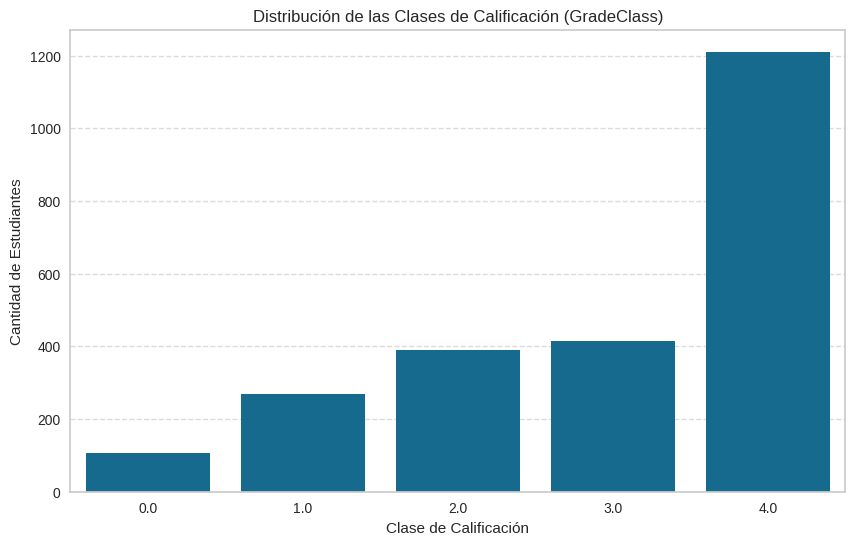

In [53]:
# Conteo de ocurrencias de cada clase en 'GradeClass'
grade_class_counts = df['GradeClass'].value_counts().sort_index()

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x=grade_class_counts.index, y=grade_class_counts.values)
plt.title('Distribución de las Clases de Calificación (GradeClass)')
plt.xlabel('Clase de Calificación')
plt.ylabel('Cantidad de Estudiantes')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### Distribucion de las columnas

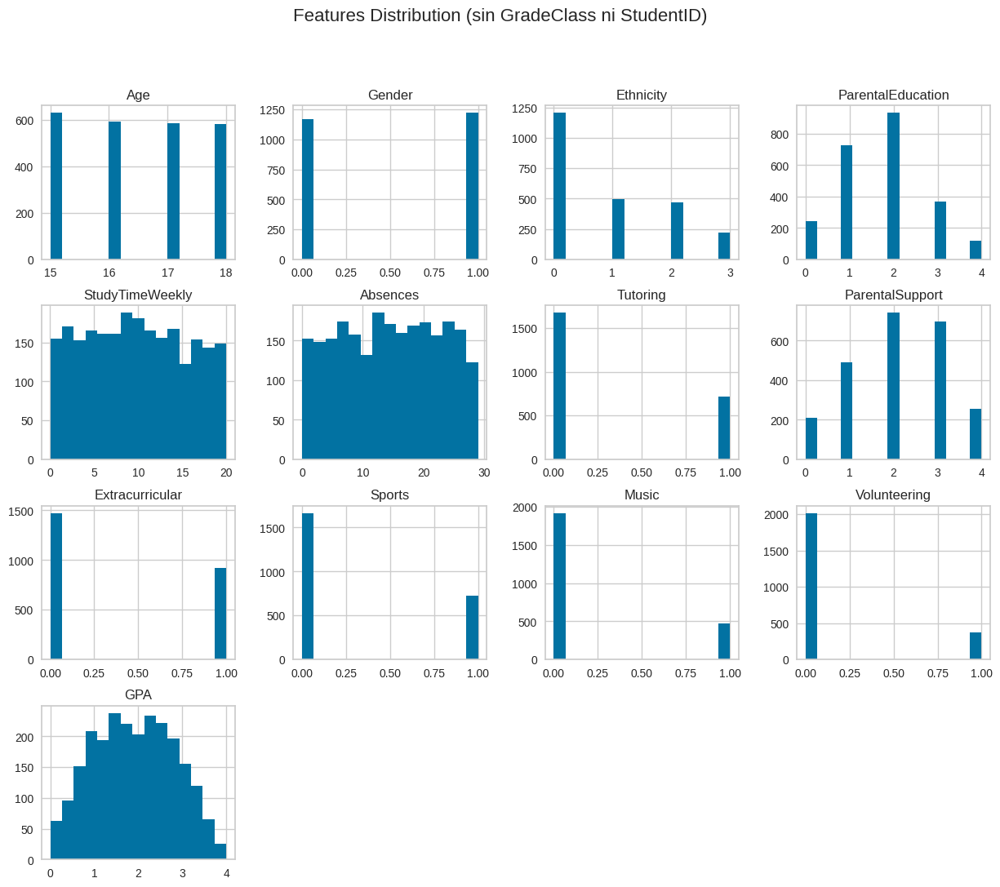

In [54]:
# Selecciona las columnas a graficar, excluyendo 'GradeClass' y 'StudentID'
cols_to_plot = [col for col in df.columns if col not in ['GradeClass', 'StudentID']]

# Genera histogramas para cada columna seleccionada
df[cols_to_plot].hist(figsize=(15, 12), bins=15)

# Título general para todos los histogramas
plt.suptitle("Features Distribution (sin GradeClass ni StudentID)", fontsize=16)
plt.show()

#### Boxplt de columnas por clase

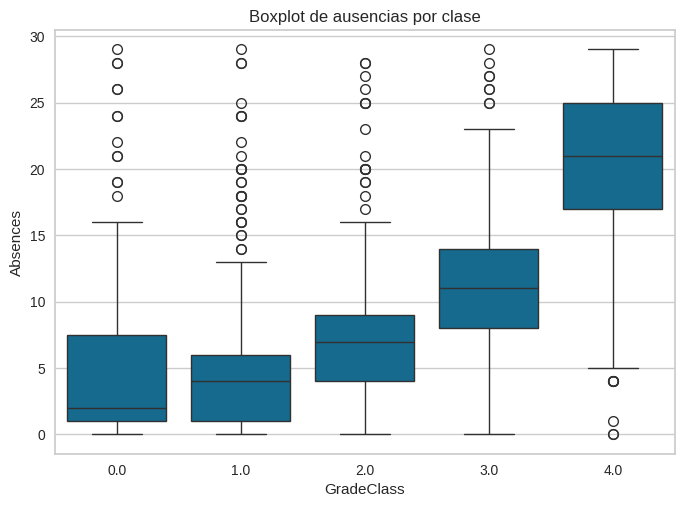

In [55]:
sns.boxplot(x='GradeClass', y='Absences', data=df)
plt.title('Boxplot de ausencias por clase')
plt.show()

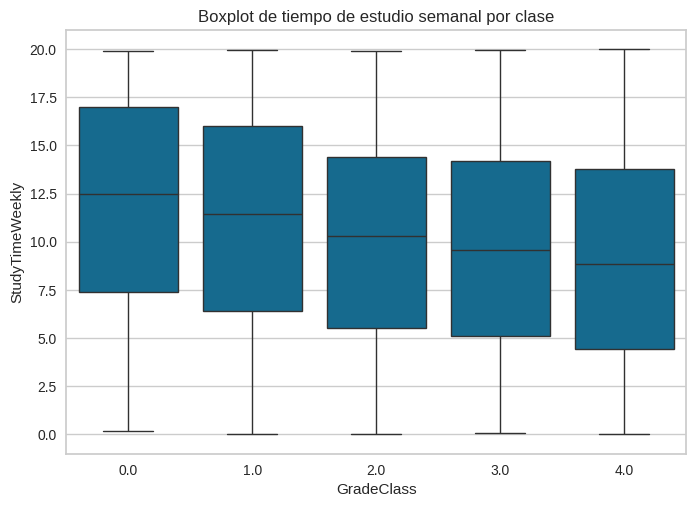

In [56]:
sns.boxplot(x='GradeClass', y='StudyTimeWeekly', data=df)
plt.title('Boxplot de tiempo de estudio semanal por clase')
plt.show()

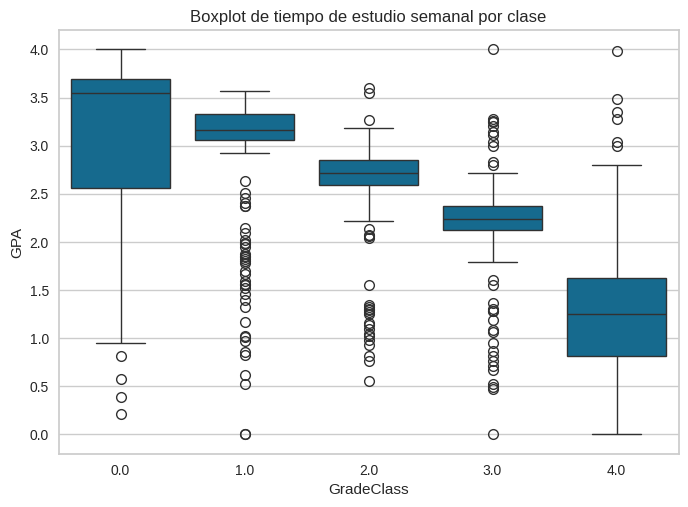

In [57]:
sns.boxplot(x='GradeClass', y='GPA', data=df)
plt.title('Boxplot de tiempo de estudio semanal por clase')
plt.show()

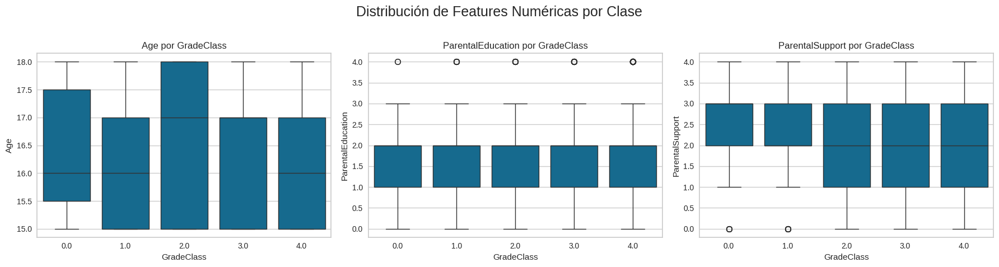

In [58]:
# Excluir columnas binarias (solo 0 y 1), 'GradeClass', 'AbsenceRange' y 'Ethnicity'
input_num_columns = [
    col for col in cols_to_plot
    if col not in ['GradeClass', 'AbsenceRange', 'Ethnicity', 'StudyTimeWeekly', 'Absences', 'GPA']
    and not (df[col].dropna().isin([0, 1]).all())
]

input_target_class = 'GradeClass'

n_cols = 3
n_rows = int(np.ceil(len(input_num_columns) / n_cols))

fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(6*n_cols, 5*n_rows))
ax = ax.flatten()

for idx, col in enumerate(input_num_columns):
    sns.boxplot(x=df[input_target_class], y=df[col], ax=ax[idx])
    ax[idx].set_title(f'{col} por {input_target_class}')

# Eliminar ejes vacíos si hay
for j in range(len(input_num_columns), len(ax)):
    fig.delaxes(ax[j])

fig.suptitle("Distribución de Features Numéricas por Clase", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

#### Grafico de torta

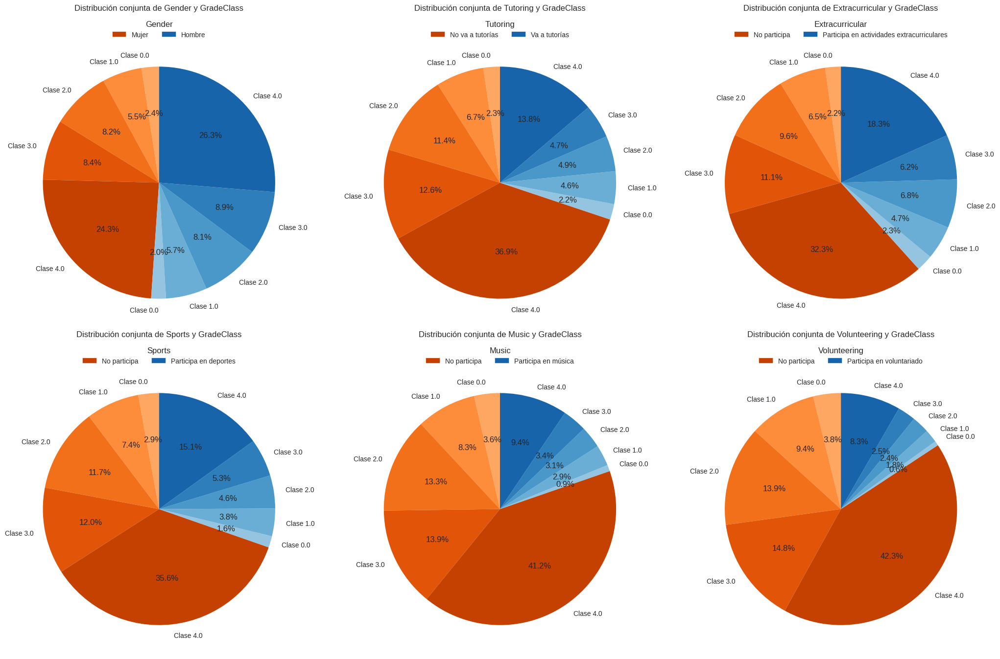

In [59]:
# Columnas binarias a analizar
binary_cols = ['Gender', 'Tutoring', 'Extracurricular', 'Sports', 'Music', 'Volunteering']

# Diccionario de explicaciones para cada columna binaria
binary_explanations = {
    'Gender': 'Sí = Hombre, No = Mujer',
    'Tutoring': 'Sí = Va a tutorías, No = No va a tutorías',
    'Extracurricular': 'Sí = Participa en actividades extracurriculares, No = No participa',
    'Sports': 'Sí = Participa en deportes, No = No participa',
    'Music': 'Sí = Participa en música, No = No participa',
    'Volunteering': 'Sí = Participa en voluntariado, No = No participa'
}

import matplotlib.patches as mpatches

n_cols = 3
n_rows = int(np.ceil(len(binary_cols) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(7*n_cols, 7*n_rows))
axes = axes.flatten()

for i, col in enumerate(binary_cols):
    counts = df.groupby([col, 'GradeClass']).size().unstack(fill_value=0)
    pie_labels = []
    pie_sizes = []
    pie_colors = []
    palette_0 = plt.cm.Oranges(np.linspace(0.4, 0.8, len(counts.columns)))
    palette_1 = plt.cm.Blues(np.linspace(0.4, 0.8, len(counts.columns)))
    legend_colors = []
    legend_labels = []
    for idx_val, val in enumerate(counts.index):
        for idx_gc, gc in enumerate(counts.columns):
            count = counts.loc[val, gc]
            if count > 0:
                label = f'Clase {gc}'
                pie_labels.append(label)
                pie_sizes.append(count)
                if val == 0:
                    pie_colors.append(palette_0[idx_gc])
                else:
                    pie_colors.append(palette_1[idx_gc])
        # Para la leyenda: usar el último color de la paleta para cada valor binario
        if val == 0:
            legend_colors.append(palette_0[-1])
            legend_labels.append(f'{binary_explanations.get(col, "").split(", No = ")[-1]}')
        else:
            legend_colors.append(palette_1[-1])
            legend_labels.append(f'{binary_explanations.get(col, "").split(", No = ")[0].replace("Sí = ", "")}')
    ax = axes[i]
    # Título
    ax.set_title(f'Distribución conjunta de {col} y GradeClass', pad=40)
    # Leyenda centrada bajo el título
    legend_patches = [mpatches.Patch(color=legend_colors[j], label=legend_labels[j]) for j in range(len(legend_labels))]
    legend = ax.legend(handles=legend_patches, title=col, loc='upper center', bbox_to_anchor=(0.5, 1.08), ncol=len(legend_labels), frameon=False)
    # Gráfico de torta
    ax.pie(pie_sizes, labels=pie_labels, colors=pie_colors, autopct='%1.1f%%', startangle=90)
    
# Eliminar ejes vacíos si hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()

#### Grafico de barra comparativo de la participación extracurricular

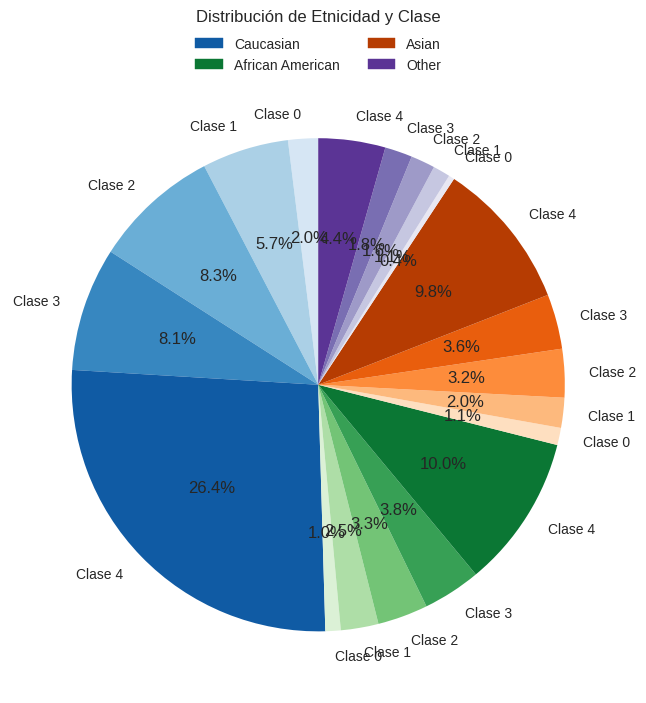

In [60]:
import matplotlib.patches as mpatches

# Diccionario para mapear los códigos de etnicidad a nombres
ethnicity_names = {
    0: "Caucasian",
    1: "African American",
    2: "Asian",
    3: "Other"
}

labels = []
sizes = []
colors = []
eth_grade_counts = df.groupby('Ethnicity')['GradeClass'].value_counts().unstack().fillna(0).astype(int)
eth_palettes = [
    sns.color_palette("Blues", n_colors=len(eth_grade_counts.columns)),
    sns.color_palette("Greens", n_colors=len(eth_grade_counts.columns)),
    sns.color_palette("Oranges", n_colors=len(eth_grade_counts.columns)),
    sns.color_palette("Purples", n_colors=len(eth_grade_counts.columns)),
]

legend_colors = []
legend_labels = []
for eth_idx, eth in enumerate(eth_grade_counts.index):
    legend_colors.append(eth_palettes[eth_idx][-1])
    legend_labels.append(ethnicity_names.get(eth, f"Ethnicity {eth}"))

# Crear el gráfico de pastel para la distribución de etnicidad y clase
for eth_idx, eth in enumerate(eth_grade_counts.index):
    for gc_idx, gc in enumerate(eth_grade_counts.columns):
        count = eth_grade_counts.loc[eth, gc]
        if count > 0:
            labels.append(f'Clase {int(gc)}')
            sizes.append(count)
            colors.append(eth_palettes[eth_idx][gc_idx])

plt.figure(figsize=(8, 8))
plt.title('Distribución de Etnicidad y Clase', pad=40)
legend_patches = [mpatches.Patch(color=legend_colors[i], label=legend_labels[i]) for i in range(len(legend_labels))]
plt.legend(handles=legend_patches, title=" ", loc='upper center', bbox_to_anchor=(0.5, 1.12), ncol=2, frameon=False)
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()


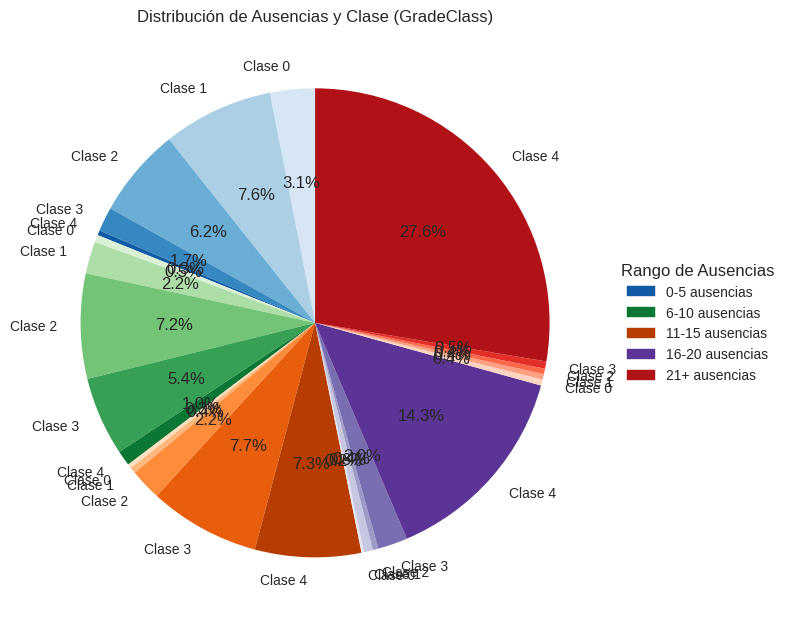

In [61]:
# Definir los rangos de ausencias
absence_ranges = {
    0: '0-5 ausencias',
    1: '6-10 ausencias',
    2: '11-15 ausencias',
    3: '16-20 ausencias',
    4: '21+ ausencias'
}

# Crear una nueva columna con el rango de ausencias
df['AbsenceRange'] = pd.cut(
    df['Absences'],
    bins=[-1, 5, 10, 15, 20, df['Absences'].max()],
    labels=[0, 1, 2, 3, 4]
)

# Calcular la tabla de contingencia entre rango de ausencias y GradeClass
absence_grade_counts = df.groupby('AbsenceRange', observed=True)['GradeClass'].value_counts().unstack().fillna(0).astype(int)

# Paletas para cada rango de ausencias
absence_palettes = [
    sns.color_palette("Blues", n_colors=len(absence_grade_counts.columns)),
    sns.color_palette("Greens", n_colors=len(absence_grade_counts.columns)),
    sns.color_palette("Oranges", n_colors=len(absence_grade_counts.columns)),
    sns.color_palette("Purples", n_colors=len(absence_grade_counts.columns)),
    sns.color_palette("Reds", n_colors=len(absence_grade_counts.columns)),
]

labels = []
sizes = []
colors = []
legend_patches = []
absence_legend_colors = []

for abs_idx, abs_range in enumerate(absence_grade_counts.index):
    for gc_idx, gc in enumerate(absence_grade_counts.columns):
        count = absence_grade_counts.loc[abs_range, gc]
        if count > 0:
            labels.append(f'Clase {int(gc)}')
            sizes.append(count)
            color = absence_palettes[abs_idx][gc_idx]
            colors.append(color)
    # Para la leyenda: usar el último color de la paleta para cada rango de ausencias
    absence_legend_colors.append(absence_palettes[abs_idx][-1])

# Crear el gráfico de torta
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
plt.title('Distribución de Ausencias y Clase (GradeClass)')

# Crear la leyenda personalizada
import matplotlib.patches as mpatches
legend_labels = [absence_ranges.get(abs_range, f'Ausencias {abs_range}') for abs_range in absence_grade_counts.index]
legend_patches = [mpatches.Patch(color=absence_legend_colors[i], label=legend_labels[i]) for i in range(len(legend_labels))]
plt.legend(handles=legend_patches, title="Rango de Ausencias", bbox_to_anchor=(1, 0.5), loc="center left")

plt.tight_layout()
plt.show()


### MATRIZ DE CORRELACION

Con esta matriz se puede visualizar como cambain los datos en funcion de otros

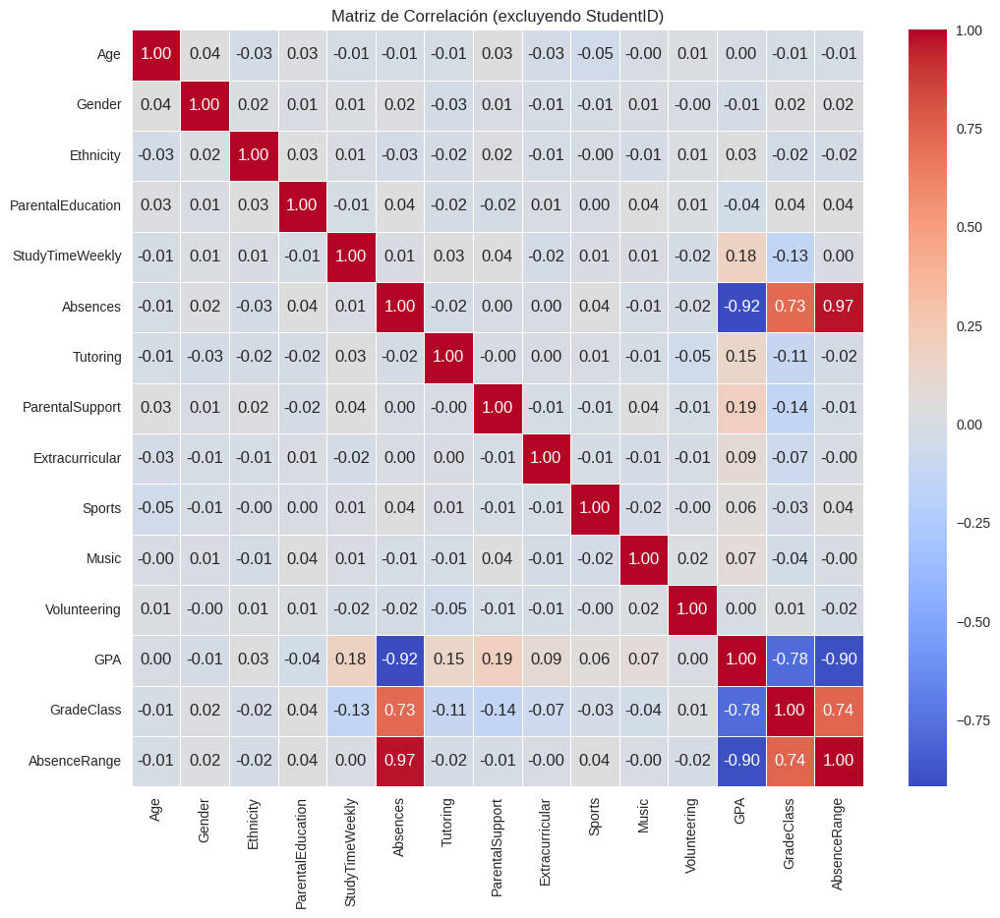

In [62]:
# Calcular la matriz de correlación excluyendo la columna 'StudentID'
correlation_matrix = df.drop('StudentID', axis=1).corr()

# Visualizar la matriz de correlación usando un mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Matriz de Correlación (excluyendo StudentID)')
plt.show()

## Limpieza del dataset

Se elimina la columna del ID y GPA, y cambia la variable objetivo para separar en 2 instancias (buen o mal estudiante), ya que las clases que habian para ello eran 4

In [63]:
df = df.drop('StudentID', axis = 1)

Separar la variable objetivo de las demás

In [64]:
X = df.drop('GradeClass', axis = 1)
X = X.values
y = df['GradeClass']

Naive Bayes sin balancear las clases, para comparar el desempeño balanceado del no balanceado y ver si existe el problema.

De todas formas se escala toda la data:

In [65]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

Luego generar los conjuntos de entrenamiento y prueba:

In [66]:
from sklearn.model_selection import train_test_split
X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

Ahora probar Naive Bayes, sin balancear

In [67]:
from sklearn.naive_bayes import GaussianNB
naive_bayes = GaussianNB()
naive_bayes.fit(X_train, y_train)
previsoes = naive_bayes.predict(X_test)

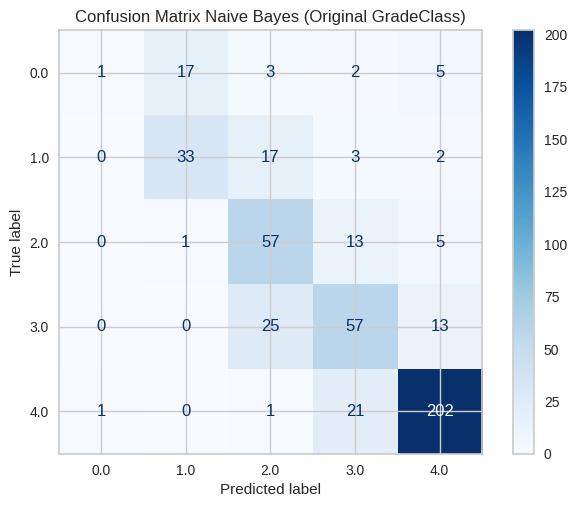

              precision    recall  f1-score   support

         0.0       0.50      0.04      0.07        28
         1.0       0.65      0.60      0.62        55
         2.0       0.55      0.75      0.64        76
         3.0       0.59      0.60      0.60        95
         4.0       0.89      0.90      0.89       225

    accuracy                           0.73       479
   macro avg       0.64      0.58      0.56       479
weighted avg       0.73      0.73      0.71       479



In [68]:
# Obtener los valores únicos de la variable GradeClass original para las etiquetas de la matriz de confusión
# Suponiendo que y_test contiene los valores originales de GradeClass (0.0, 1.0, 2.0, 3.0, 4.0)
display_labels = sorted(y_test.unique())

# Calcula la amtriz de confusion
cm = confusion_matrix(y_test, previsoes)

# Muestra la matriz de confusion
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=display_labels)
disp.plot(cmap="Blues", values_format="d")
plt.title('Confusion Matrix Naive Bayes (Original GradeClass)') # Add a title
plt.show()

print(classification_report(y_test, previsoes))

### Curva ROC

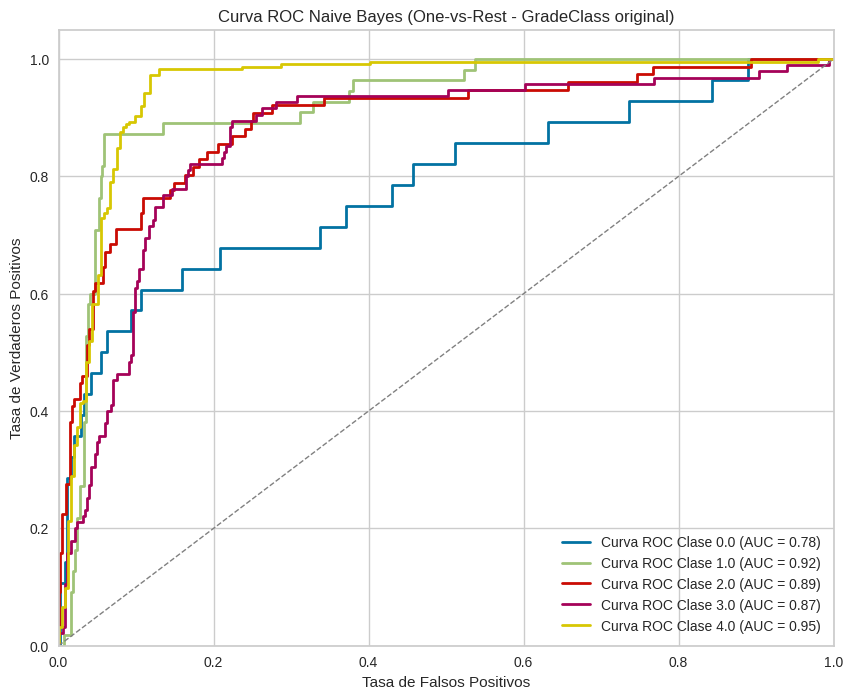

In [69]:
# Curva ROC para clasificación multiclase (One-vs-Rest)
# Esto requiere y_test y previsoes del primer Naive Bayes antes de la transformación binaria y balanceo.

# Obtener las etiquetas únicas de la variable GradeClass original
original_labels = sorted(np.unique(y_test)) # y_test de la primera partición

plt.figure(figsize=(10, 8))

# Calcular la curva ROC para cada clase
for i in range(len(original_labels)):
    # Crear una versión binaria de y_test para la clase actual (uno vs resto)
    binary_y_test = (y_test == original_labels[i]).astype(int)

    # Obtener las probabilidades estimadas para la clase actual
    # naive_bayes.predict_proba retorna probabilidades para cada clase en orden
    y_prob_class = naive_bayes.predict_proba(X_test)[:, i] # Se asume que el orden de clases coincide

    # Calcular la curva ROC
    fpr, tpr, thresholds = roc_curve(binary_y_test, y_prob_class)

    # Calcular el AUC
    auc_score = auc(fpr, tpr)

    # Graficar la curva ROC para la clase actual
    plt.plot(fpr, tpr, lw=2, label=f'Curva ROC Clase {original_labels[i]} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC Naive Bayes (One-vs-Rest - GradeClass original)')
plt.legend(loc='lower right')
plt.show()


### Balancear las clases

Ahora que se han hecho los calculos sin balancear, se balancean las clases.

En el EDA vimos que el dataset está desbalanceado. Hay una relación 12:1 entre los estudiantes 0 y 4 (los 2 polos)

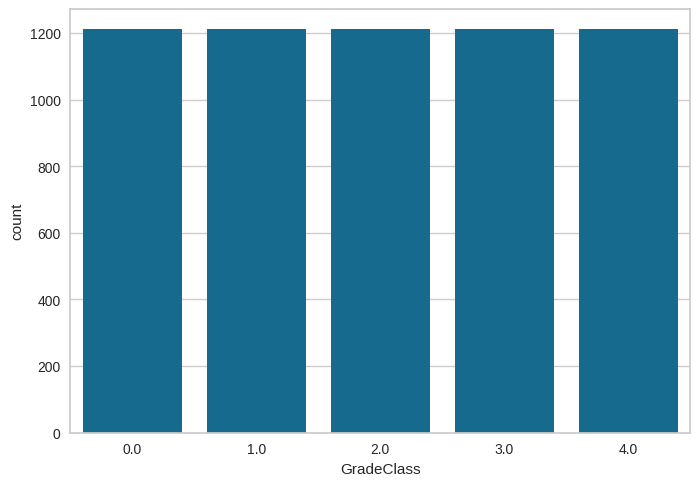

In [70]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X, y = ros.fit_resample(X, y)
ax = sns.countplot(x=y)

### Cambiar las escalas

Se usa StandardScaler para poner toda la data en la misma escala

In [71]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

## Modelos a usar
Con el dataset ya limpio se pueden usar diferentes modelos


### Naive Bayes
Se usa el modelo de Naive Bayes, testeando el modelo Gaussiano con la data Normal

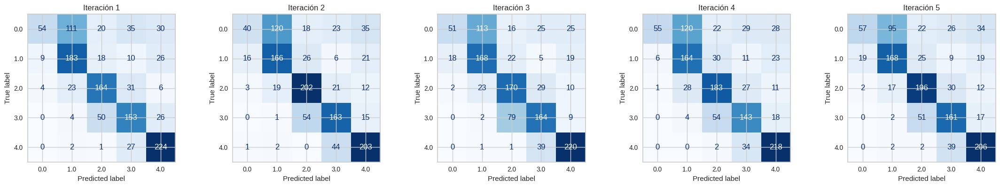

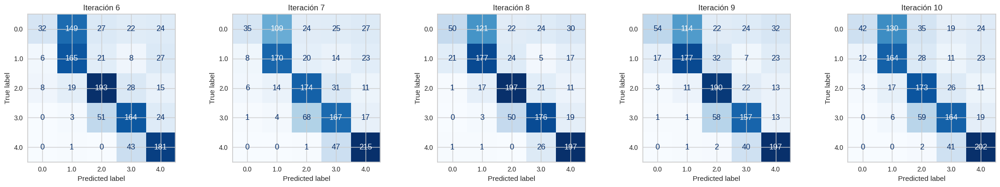

In [72]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split

# Listas para guardar los resultados de cada clase y accuracy
precision_list_NB = []
recall_list_NB = []
f1_list_NB = []
support_list_NB = []
accuracy_list_NB = []

# Para guardar las matrices de confusión de cada iteración
cms = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)
    naive_bayes = GaussianNB()
    naive_bayes.fit(X_train, y_train)
    previsoes = naive_bayes.predict(X_test)

    report = classification_report(y_test, previsoes, output_dict=True)
    for clase in ['0.0', '1.0', '2.0', '3.0', '4.0']:
        if clase in report:
            precision_list_NB.append(report[clase]['precision'])
            recall_list_NB.append(report[clase]['recall'])
            f1_list_NB.append(report[clase]['f1-score'])
            support_list_NB.append(report[clase]['support'])
        else:
            precision_list_NB.append(0)
            recall_list_NB.append(0)
            f1_list_NB.append(0)
            support_list_NB.append(0)
    # Guardar accuracy
    accuracy_list_NB.append(accuracy_score(y_test, previsoes))
    # Guardar matriz de confusión
    cms.append(confusion_matrix(y_test, previsoes))

# Mostrar las matrices de confusión en 2 tandas de 5
for tanda in range(2):
    fig, axes = plt.subplots(1, 5, figsize=(22, 4))
    for j in range(5):
        idx = tanda * 5 + j
        disp = ConfusionMatrixDisplay(confusion_matrix=cms[idx], display_labels=[0.0, 1.0, 2.0, 3.0, 4.0])
        disp.plot(ax=axes[j], cmap="Blues", values_format="d", colorbar=False)
        axes[j].set_title(f'Iteración {idx+1}')
    plt.tight_layout()
    plt.show()

Testeando con el modelo no parametrico

/usr/local/lib64/python3.13/site-packages/sklearn/preprocessing/_discretization.py:306: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  warnings.warn(
/usr/local/lib64/python3.13/site-packages/sklearn/preprocessing/_discretization.py:306: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 1 are removed. Consider decreasing the number of bins.
  warnings.warn(
/usr/local/lib64/python3.13/site-packages/sklearn/preprocessing/_discretization.py:306: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 2 are removed. Consider decreasing the number of bins.
  warnings.warn(
/usr/local/lib64/python3.13/site-packages/sklearn/preprocessing/_discretization.py:306: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 3 are removed. Consider decreasing the number of bins.
  warnings.warn(
/usr/local/lib64/python3.13/site-packages/sklearn/preprocessing/_discretizat

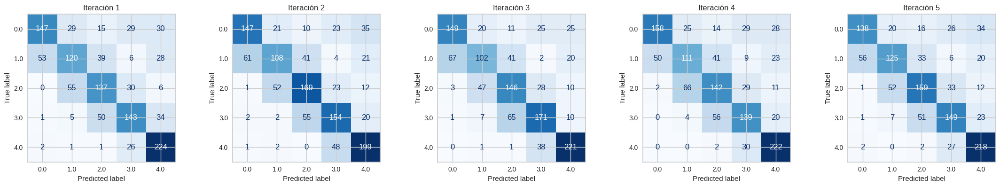

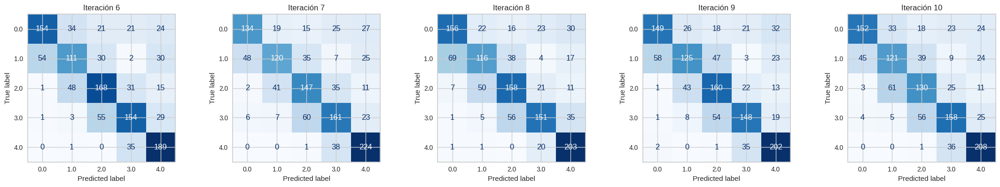

In [73]:
from sklearn.naive_bayes import CategoricalNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import KBinsDiscretizer
import matplotlib.pyplot as plt

# Listas para guardar los resultados
precision_list2 = []
recall_list2 = []
f1_list2 = []
support_list2 = []
accuracy_list2 = []
cms2 = []

# Discretizador: transforma atributos numéricos a categorías
discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)

    # Ajustar y transformar con bins
    X_train_disc = discretizer.fit_transform(X_train)
    X_test_disc = discretizer.transform(X_test)

    # Naive Bayes con atributos discretos
    naive_bayes = CategoricalNB()
    naive_bayes.fit(X_train_disc, y_train)
    previsoes = naive_bayes.predict(X_test_disc)

    report = classification_report(y_test, previsoes, output_dict=True)
    for clase in ['0.0', '1.0', '2.0', '3.0', '4.0']:
        if clase in report:
            precision_list2.append(report[clase]['precision'])
            recall_list2.append(report[clase]['recall'])
            f1_list2.append(report[clase]['f1-score'])
            support_list2.append(report[clase]['support'])
        else:
            precision_list2.append(0)
            recall_list2.append(0)
            f1_list2.append(0)
            support_list2.append(0)

    accuracy_list2.append(accuracy_score(y_test, previsoes))
    cms2.append(confusion_matrix(y_test, previsoes))

# Mostrar matrices de confusión
for tanda in range(2):
    fig, axes = plt.subplots(1, 5, figsize=(22, 4))
    for j in range(5):
        idx = tanda * 5 + j
        disp = ConfusionMatrixDisplay(confusion_matrix=cms2[idx], display_labels=[0.0, 1.0, 2.0, 3.0, 4.0])
        disp.plot(ax=axes[j], cmap="Blues", values_format="d", colorbar=False)
        axes[j].set_title(f'Iteración {idx+1}')
    plt.tight_layout()
    plt.show()


#### Comparacion

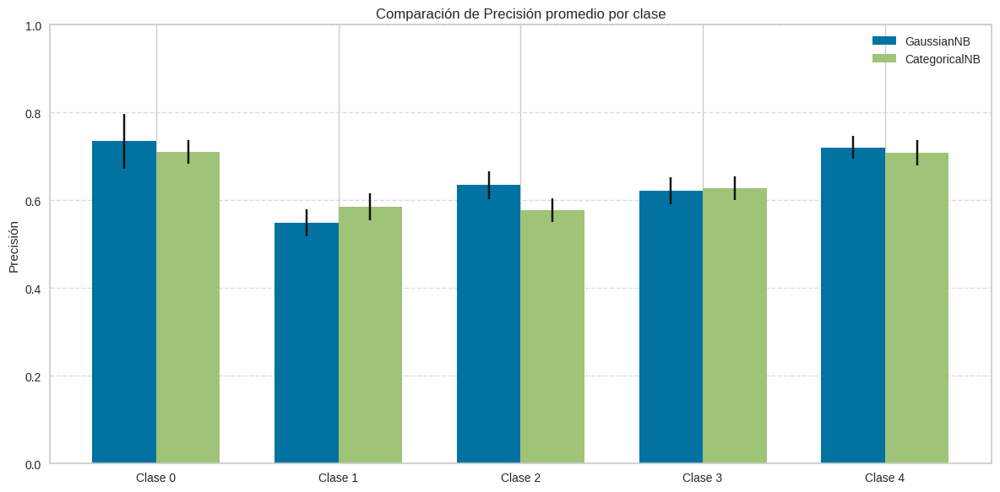

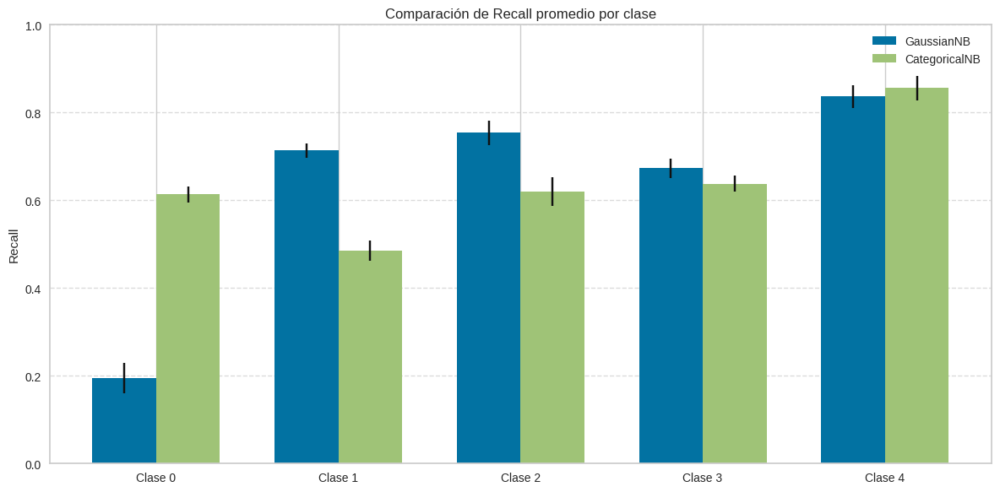

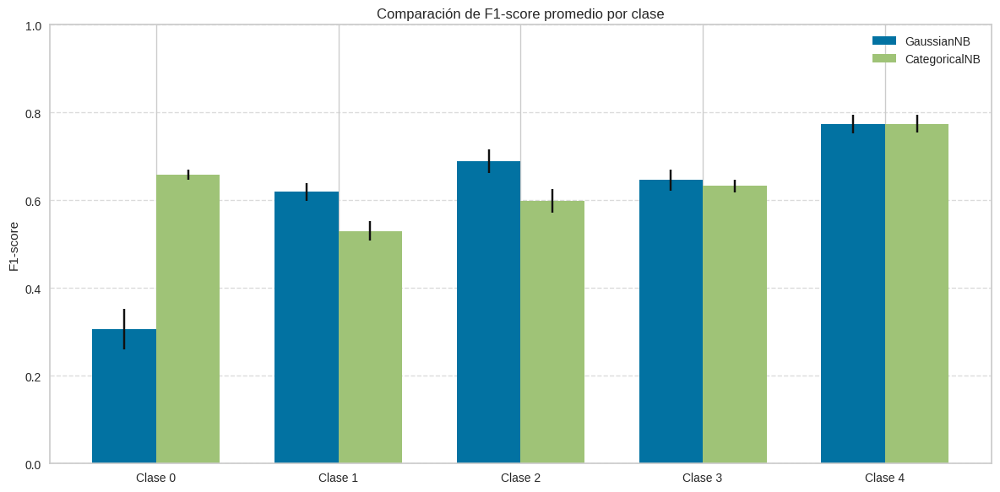

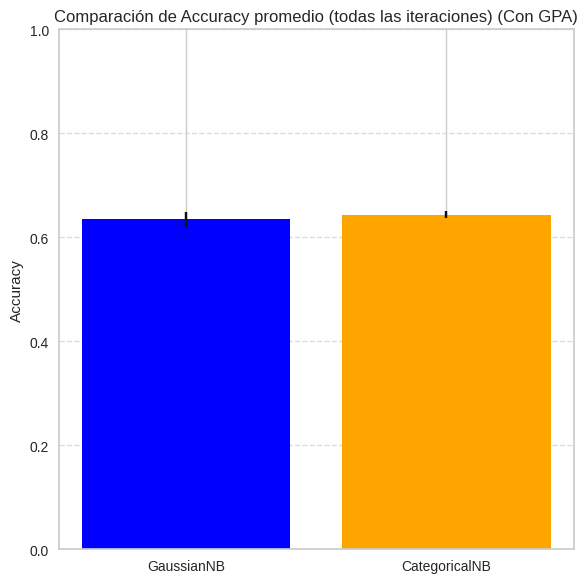

In [74]:
import matplotlib.pyplot as plt
import numpy as np

clases = [0.0, 1.0, 2.0, 3.0, 4.0]
num_iter = int(len(precision_list_NB) / len(clases))

def promedio_y_std_por_clase(lista):
    data = np.array(lista).reshape(num_iter, len(clases))
    return data.mean(axis=0), data.std(axis=0)

# Calcular promedios y std para ambos modelos
precision_avg, precision_std = promedio_y_std_por_clase(precision_list_NB)
recall_avg, recall_std = promedio_y_std_por_clase(recall_list_NB)
f1_avg, f1_std = promedio_y_std_por_clase(f1_list_NB)

precision_avg2, precision_std2 = promedio_y_std_por_clase(precision_list2)
recall_avg2, recall_std2 = promedio_y_std_por_clase(recall_list2)
f1_avg2, f1_std2 = promedio_y_std_por_clase(f1_list2)

# Accuracy promedio y std
accuracy_avg = np.mean(accuracy_list_NB)
accuracy_std = np.std(accuracy_list_NB)
accuracy_avg2 = np.mean(accuracy_list2)
accuracy_std2 = np.std(accuracy_list2)

x = np.arange(len(clases))
width = 0.35

# Precisión
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, precision_avg, width, yerr=precision_std, capsize=5, label='GaussianNB')
plt.bar(x + width/2, precision_avg2, width, yerr=precision_std2, capsize=5, label='CategoricalNB')
plt.xticks(x, [f'Clase {int(c)}' for c in clases])
plt.ylabel('Precisión')
plt.title('Comparación de Precisión promedio por clase')
plt.ylim(0, 1)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Recall
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, recall_avg, width, yerr=recall_std, capsize=5, label='GaussianNB')
plt.bar(x + width/2, recall_avg2, width, yerr=recall_std2, capsize=5, label='CategoricalNB')
plt.xticks(x, [f'Clase {int(c)}' for c in clases])
plt.ylabel('Recall')
plt.title('Comparación de Recall promedio por clase')
plt.ylim(0, 1)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# F1-score
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, f1_avg, width, yerr=f1_std, capsize=5, label='GaussianNB')
plt.bar(x + width/2, f1_avg2, width, yerr=f1_std2, capsize=5, label='CategoricalNB')
plt.xticks(x, [f'Clase {int(c)}' for c in clases])
plt.ylabel('F1-score')
plt.title('Comparación de F1-score promedio por clase')
plt.ylim(0, 1)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Accuracy global
plt.figure(figsize=(6, 6))
plt.bar(['GaussianNB', 'CategoricalNB'], [accuracy_avg, accuracy_avg2], yerr=[accuracy_std, accuracy_std2], color=['blue', 'orange'], capsize=10)
plt.ylabel('Accuracy')
plt.title('Comparación de Accuracy promedio (todas las iteraciones) (Con GPA)')
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#### Curva ROC

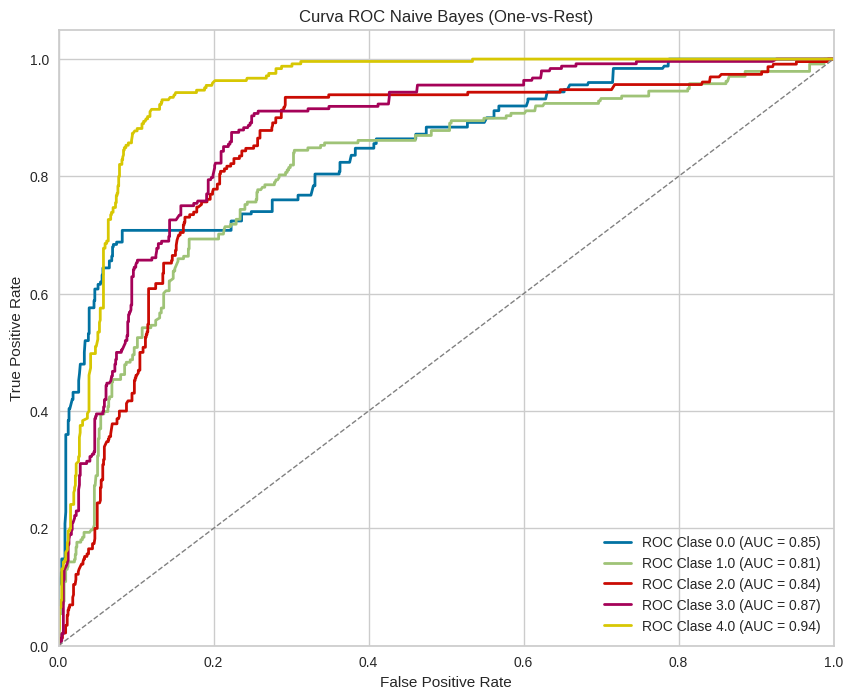

In [75]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# Suponiendo que ya tienes:
# naive_bayes entrenado con CategoricalNB
# X_test_disc (X_test discretizado)
# y_test (original)
# original_labels = sorted(np.unique(y_test))

plt.figure(figsize=(10, 8))

for i in range(len(original_labels)):
    # Binariza la clase actual
    binary_y_test = (y_test == original_labels[i]).astype(int)
    # Probabilidades para la clase actual
    y_prob_class = naive_bayes.predict_proba(X_test_disc)[:, i]
    fpr, tpr, thresholds = roc_curve(binary_y_test, y_prob_class)
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'ROC Clase {original_labels[i]} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC Naive Bayes (One-vs-Rest)')
plt.legend(loc='lower right')
plt.show()

### K Neighbors
KNN con GridSearch para buscar las mejores metricas para el modelo

Usar GridSearch

Busqueda de la mejor cantidad de vecinos

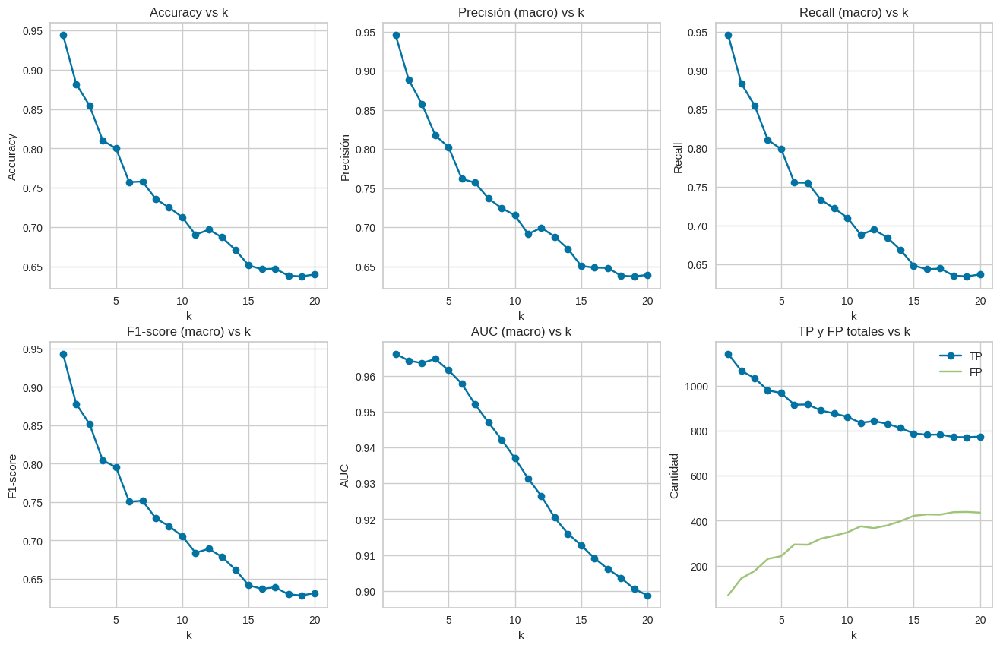

In [76]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

# Listas para guardar métricas por valor de k
accuracy_list_knn = []
precision_list_knn = []
recall_list_knn = []
f1_list_knn = []
auc_list_knn = []
fp_list_knn = []
tp_list_knn = []

k_range = range(1, 21)

for k in k_range:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
    knn = KNeighborsClassifier(n_neighbors=k, metric='minkowski', p=2)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    # FP y TP para todas las clases (suma de la diagonal y fuera de la diagonal)
    tp = np.diag(cm).sum()
    fp = cm.sum() - tp
    tp_list_knn.append(tp)
    fp_list_knn.append(fp)
    # Precisión, recall y F1 macro
    report = classification_report(y_test, y_pred, output_dict=True)
    precision_list_knn.append(report['macro avg']['precision'])
    recall_list_knn.append(report['macro avg']['recall'])
    f1_list_knn.append(report['macro avg']['f1-score'])
    accuracy_list_knn.append(accuracy_score(y_test, y_pred))
    # ROC y AUC (solo si es binario o multiclase One-vs-Rest)
    if len(np.unique(y)) == 2:
        y_prob = knn.predict_proba(X_test)[:, 1]
        auc_list_knn.append(roc_auc_score(y_test, y_prob))
    else:
        # Multiclase: promedio macro del AUC
        from sklearn.preprocessing import label_binarize
        y_test_bin = label_binarize(y_test, classes=sorted(np.unique(y)))
        y_prob = knn.predict_proba(X_test)
        auc_macro = np.mean([roc_auc_score(y_test_bin[:, i], y_prob[:, i]) for i in range(y_prob.shape[1])])
        auc_list_knn.append(auc_macro)

# Graficar métricas vs k
plt.figure(figsize=(16, 10))

plt.subplot(2, 3, 1)
plt.plot(k_range, accuracy_list_knn, marker='o')
plt.title('Accuracy vs k')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.grid(True)

plt.subplot(2, 3, 2)
plt.plot(k_range, precision_list_knn, marker='o')
plt.title('Precisión (macro) vs k')
plt.xlabel('k')
plt.ylabel('Precisión')
plt.grid(True)

plt.subplot(2, 3, 3)
plt.plot(k_range, recall_list_knn, marker='o')
plt.title('Recall (macro) vs k')
plt.xlabel('k')
plt.ylabel('Recall')
plt.grid(True)

plt.subplot(2, 3, 4)
plt.plot(k_range, f1_list_knn, marker='o')
plt.title('F1-score (macro) vs k')
plt.xlabel('k')
plt.ylabel('F1-score')
plt.grid(True)

plt.subplot(2, 3, 5)
plt.plot(k_range, auc_list_knn, marker='o')
plt.title('AUC (macro) vs k')
plt.xlabel('k')
plt.ylabel('AUC')
plt.grid(True)

plt.subplot(2, 3, 6)
plt.plot(k_range, tp_list_knn, marker='o', label='TP')
plt.plot(k_range, fp_list_knn, marker='x', label='FP')
plt.title('TP y FP totales vs k')
plt.xlabel('k')
plt.ylabel('Cantidad')
plt.legend()
plt.grid(True)

Pruba con 3 vecinos


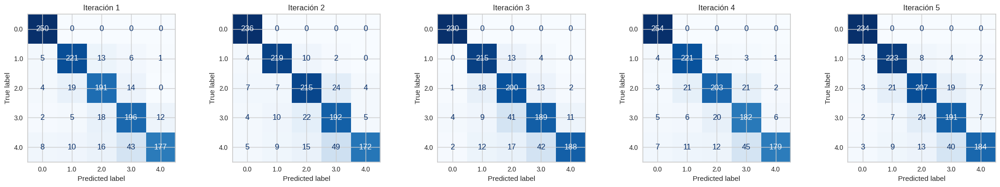

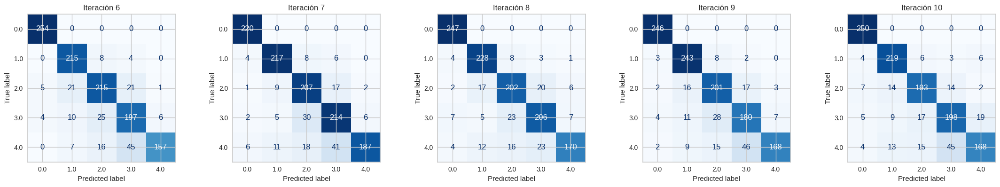

[0.8546655656482246, 0.8538398018166804, 0.8439306358381503, 0.8579686209744013, 0.8579686209744013, 0.8571428571428571, 0.8629232039636664, 0.8695293146160198, 0.8571428571428571, 0.8488852188274154]


In [77]:
from sklearn.neighbors import KNeighborsClassifier

# Listas para guardar los resultados de cada clase para KNN
precision_list_knn = []
recall_list_knn = []
f1_list_knn = []
support_list_knn = []
accuracy_list_knn = []
cms_knn = []

for i in range(0, 10):  
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)
    knn = KNeighborsClassifier(n_neighbors=3, metric='minkowski', p=2)
    knn.fit(X_train, y_train)
    previsoes = knn.predict(X_test)

    report = classification_report(y_test, previsoes, output_dict=True)
    for clase in ['0.0', '1.0', '2.0', '3.0', '4.0']:
        if clase in report:
            precision_list_knn.append(report[clase]['precision'])
            recall_list_knn.append(report[clase]['recall'])
            f1_list_knn.append(report[clase]['f1-score'])
            support_list_knn.append(report[clase]['support'])
        else:
            precision_list_knn.append(0)
            recall_list_knn.append(0)
            f1_list_knn.append(0)
            support_list_knn.append(0)
    cm = confusion_matrix(y_test, previsoes)
    cms_knn.append(cm)
    accuracy_list_knn.append(accuracy_score(y_test, previsoes))

# Mostrar las matrices de confusión en tandas de 5 para KNN
for tanda in range(2):
    fig, axes = plt.subplots(1, 5, figsize=(22, 4))
    for j in range(5):
        idx = tanda * 5 + j
        disp = ConfusionMatrixDisplay(confusion_matrix=cms_knn[idx], display_labels=[0.0, 1.0, 2.0, 3.0, 4.0])
        disp.plot(ax=axes[j], cmap="Blues", values_format="d", colorbar=False)
        axes[j].set_title(f'Iteración {idx+1}')
    plt.tight_layout()
    plt.show()
    
print(accuracy_list_knn)


#### Metricas

/tmp/ipykernel_144403/485494512.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_por_clase, showmeans=True, labels=[f'Clase {int(c)}' for c in clases])
/tmp/ipykernel_144403/485494512.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_por_clase, showmeans=True, labels=[f'Clase {int(c)}' for c in clases])
/tmp/ipykernel_144403/485494512.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_por_clase, showmeans=True, labels=[f'Clase {int(c)}' for c in clases])
/tmp/ipykernel_144403/485494512.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() h

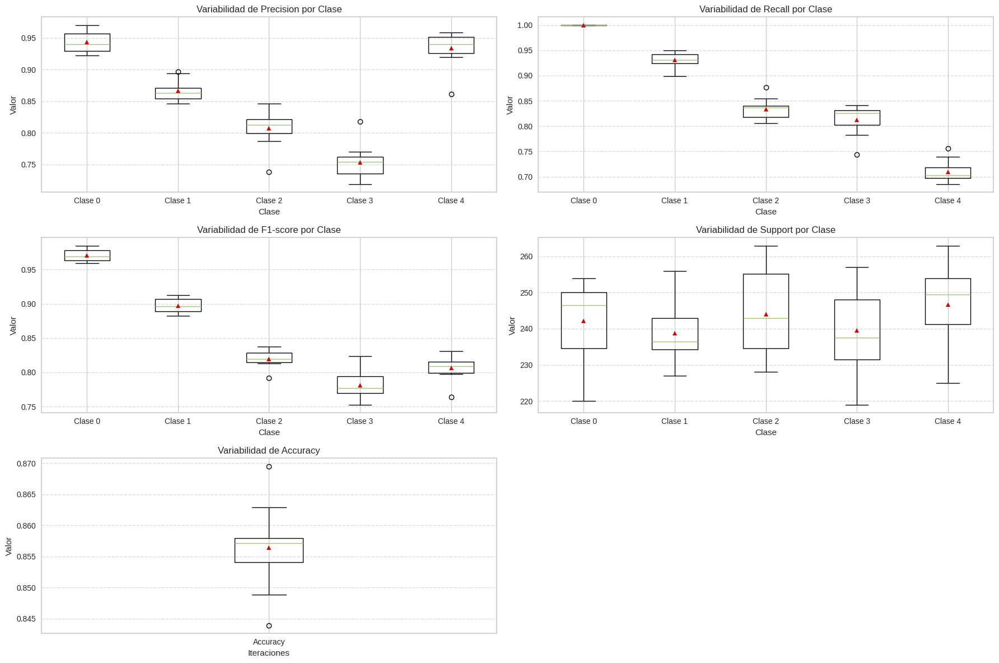

In [78]:
metricas = {
    'Precision': precision_list_knn,
    'Recall': recall_list_knn,
    'F1-score': f1_list_knn,
    'Support': support_list_knn,
    'Accuracy': accuracy_list_knn  # Agrega la lista de accuracy
}

clases = [0.0, 1.0, 2.0, 3.0, 4.0]
num_iter = int(len(precision_list_knn) / len(clases))

plt.figure(figsize=(18, 12))
for i, (nombre, valores) in enumerate(metricas.items(), 1):
    plt.subplot(3, 2, i)
    if nombre == 'Accuracy':
        # Accuracy es una sola lista por iteración, no por clase
        plt.boxplot(valores, showmeans=True, labels=['Accuracy'])
        plt.title('Variabilidad de Accuracy')
        plt.ylabel('Valor')
        plt.xlabel('Iteraciones')
    else:
        # Agrupar los valores por clase
        data_por_clase = [valores[j::len(clases)] for j in range(len(clases))]
        plt.boxplot(data_por_clase, showmeans=True, labels=[f'Clase {int(c)}' for c in clases])
        plt.title(f'Variabilidad de {nombre} por Clase')
        plt.ylabel('Valor')
        plt.xlabel('Clase')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#### Curva ROC

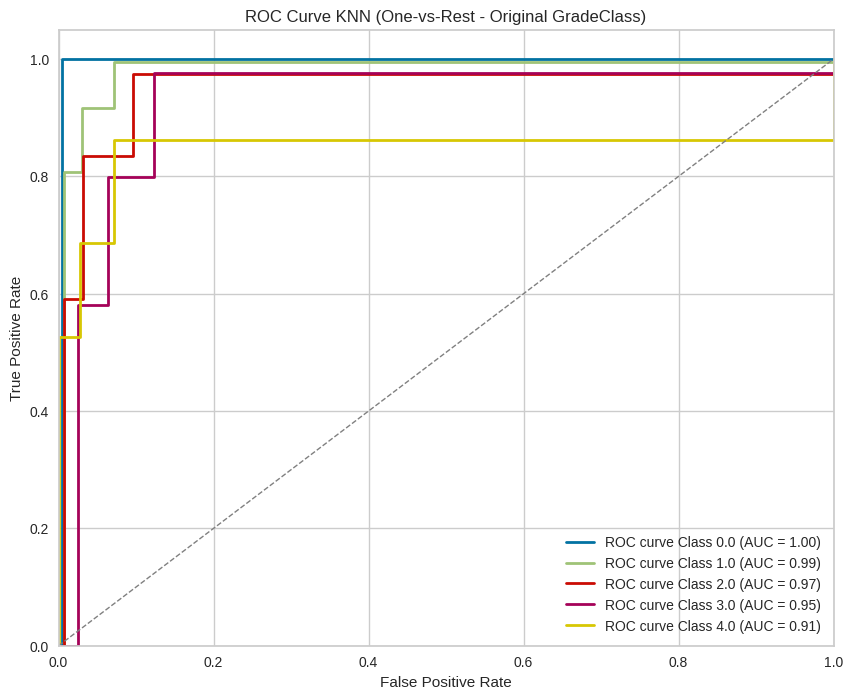

In [79]:
# Curva ROC para KNN (One-vs-Rest, última iteración)
original_labels = sorted(np.unique(y_test))

plt.figure(figsize=(10, 8))

for i in range(len(original_labels)):
    binary_y_test = (y_test == original_labels[i]).astype(int)
    y_prob_class = knn.predict_proba(X_test)[:, i]
    fpr, tpr, thresholds = roc_curve(binary_y_test, y_prob_class)
    auc_score = auc(fpr, tpr)
    plt.step(fpr, tpr, where='post', lw=2, label=f'ROC curve Class {original_labels[i]} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve KNN (One-vs-Rest - Original GradeClass)')
plt.legend(loc='lower right')
plt.show()


### Árboles de decisiones
Árbol de decisión, testea Entropía y cálculos de Gini.
Usar GridSearch para revisar cuales son las mejores métricas para usar.


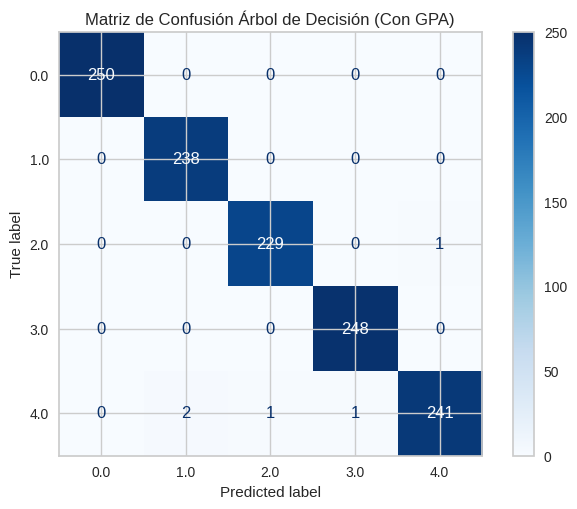

In [80]:
from sklearn.tree import DecisionTreeClassifier

# Listas para guardar los resultados de cada clase para Árbol de Decisión
precision_list_tree = []
recall_list_tree = []
f1_list_tree = []
support_list_tree = []
accuracy_list_tree = []
cms_tree = []

# Separar los datos en entrenamiento y validación
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
# Árbol SIN poda (sin limitar max_depth)
tree_full = DecisionTreeClassifier(random_state=42)
tree_full.fit(X_train, y_train)
y_pred_full = tree_full.predict(X_val)
y_prob_full = tree_full.predict_proba(X_val)
previsoes = tree_full.predict(X_test)

report = classification_report(y_test, previsoes, output_dict=True)
accuracy = accuracy_score(y_test, previsoes)
accuracy_list_tree.append(accuracy)

for clase in ['0.0', '1.0', '2.0', '3.0', '4.0']:
    if clase in report:
        precision_list_tree.append(report[clase]['precision'])
        recall_list_tree.append(report[clase]['recall'])
        f1_list_tree.append(report[clase]['f1-score'])
        support_list_tree.append(report[clase]['support'])
    else:
        precision_list_tree.append(0)
        recall_list_tree.append(0)
        f1_list_tree.append(0)
        support_list_tree.append(0)
cm = confusion_matrix(y_test, previsoes)
cms_tree.append(cm)

# Mostrar solo una matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0.0, 1.0, 2.0, 3.0, 4.0])
disp.plot(cmap="Blues", values_format="d")
plt.title('Matriz de Confusión Árbol de Decisión (Con GPA)')
plt.show()


#### curva roc

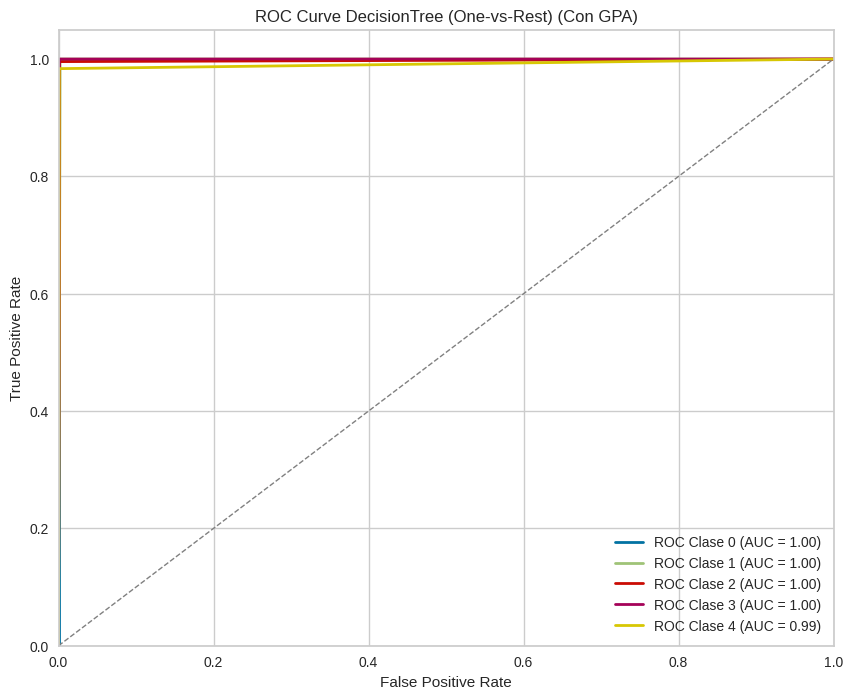

In [81]:
from sklearn.preprocessing import label_binarize

# Binarizar las clases para ROC multiclase
y_test_bin = label_binarize(y_test, classes=[0.0, 1.0, 2.0, 3.0, 4.0])
n_classes = y_test_bin.shape[1]
y_score = tree_full.predict_proba(X_test)

plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'ROC Clase {i} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve DecisionTree (One-vs-Rest) (Con GPA)')
plt.legend(loc='lower right')
plt.show()


#### Peso por columna

In [82]:
# Mostrar la importancia de cada columna (feature importance) del último árbol de decisión creado
columns = df.drop(['GradeClass'], axis=1).columns
feature_importance = pd.Series(tree_full.feature_importances_, index=columns).sort_values(ascending=False)
print(feature_importance)

GPA                  0.756275
StudyTimeWeekly      0.080992
Absences             0.032119
ParentalSupport      0.023162
Ethnicity            0.021703
Age                  0.021255
ParentalEducation    0.018736
Volunteering         0.008884
Gender               0.008810
Tutoring             0.007640
Sports               0.006686
AbsenceRange         0.005023
Music                0.004495
Extracurricular      0.004221
dtype: float64


#### Ultimo arbol creado


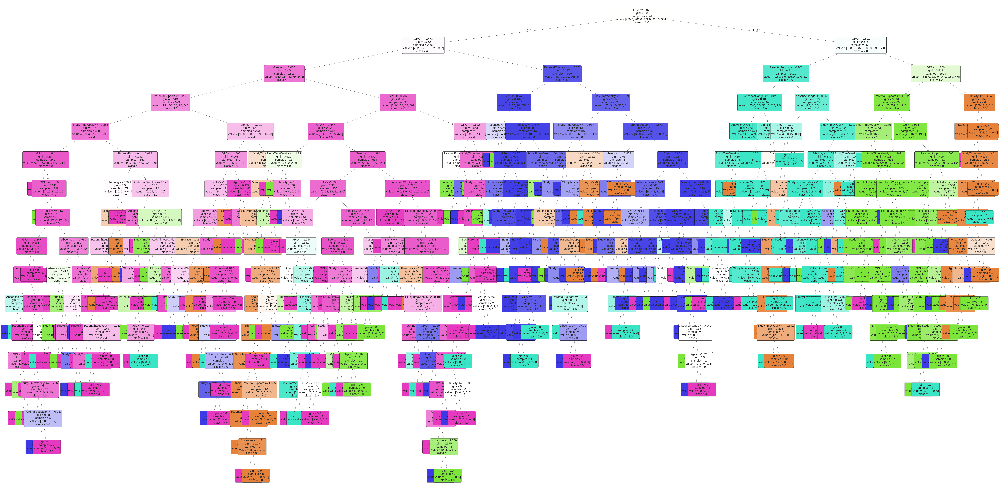

In [83]:
plt.figure(figsize=(48, 24), dpi=200)
plot_tree(
    tree_full,
    filled=True,
    feature_names=df.drop(['GradeClass'], axis=1).columns,
    class_names=[str(c) for c in sorted(y.unique())],
    rounded=True,
    fontsize=10  # Reduce el tamaño de fuente para que quepan más textos
)
plt.tight_layout()
plt.subplots_adjust(left=0.01, right=0.99, top=0.99, bottom=0.01, hspace=1.0, wspace=1.0)  # Más espacio entre nodos
plt.show()

#### Arbol podado

Métricas de Evaluación del Árbol de Decisión Podado (max_depth=3):
Accuracy: 0.1874483897605285
Precision (macro): 0.1874851623492734
Recall (clase 1): 0.13478260869565217
F1 Score (clase 1): 0.15346534653465346


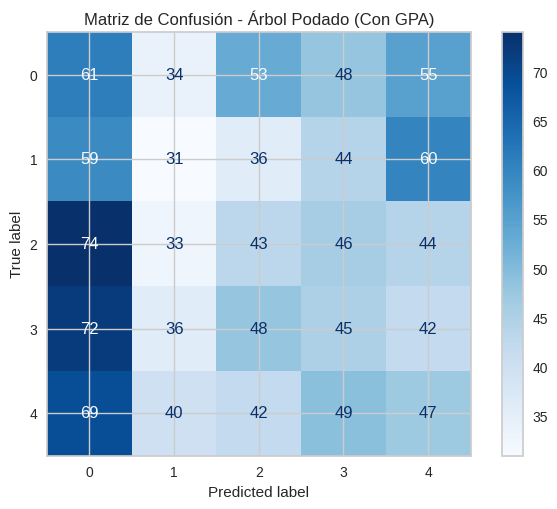

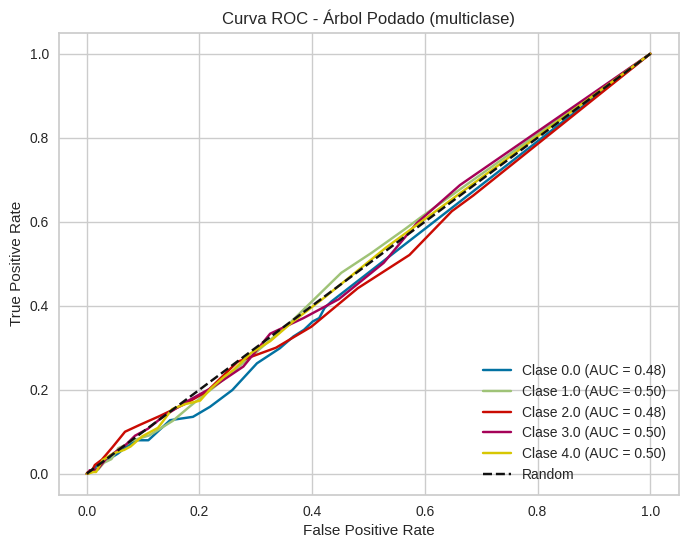

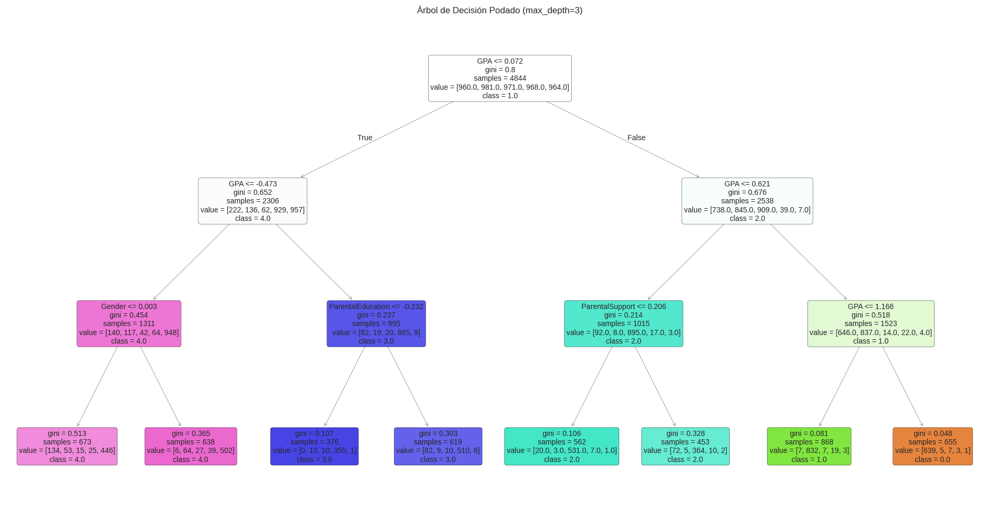

In [84]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.preprocessing import label_binarize
from sklearn.metrics import accuracy_score, precision_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Separar los datos en entrenamiento y validación (ya escalados y balanceados)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

tree_pruned = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_pruned.fit(X_train, y_train)
y_pred_pruned = tree_pruned.predict(X_val)
y_prob_pruned = tree_pruned.predict_proba(X_val)

y_val_bin = label_binarize(y_val, classes=sorted(set(y)))
roc_auc = {}
for i, clase in enumerate(sorted(set(y))):
    roc_auc[clase] = roc_auc_score(y_val_bin[:, i], y_prob[:, i])

accuracy = accuracy_score(y_val, y_pred)
precision = precision_score(y_val, y_pred, average='macro')
report = classification_report(y_val, y_pred, output_dict=True)
cm = confusion_matrix(y_val, y_pred)

print("Métricas de Evaluación del Árbol de Decisión Podado (max_depth=3):")
print("Accuracy:", accuracy)
print("Precision (macro):", precision)
if '1.0' in report:
    print("Recall (clase 1):", report['1.0']['recall'])
    print("F1 Score (clase 1):", report['1.0']['f1-score'])

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title('Matriz de Confusión - Árbol Podado (Con GPA)')
plt.show()

# Curva ROC para multiclase (One-vs-Rest)
if len(set(y)) > 2:
    from sklearn.metrics import auc
    plt.figure(figsize=(8, 6))
    for i, clase in enumerate(sorted(set(y))):
        fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_prob[:, i])
        plt.plot(fpr, tpr, label=f'Clase {clase} (AUC = {roc_auc[clase]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', label='Random')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Curva ROC - Árbol Podado (multiclase)')
    plt.legend(loc='lower right')
    plt.show()
else:
    fpr, tpr, thresholds = roc_curve(y_val, y_prob)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', label='Random')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Curva ROC - Árbol Podado')
    plt.legend(loc='lower right')
    plt.show()

# Visualización del árbol podado
feature_names = df.drop(['GradeClass'], axis=1).columns if hasattr(df, 'columns') else None

plt.figure(figsize=(24, 12))
plot_tree(
    tree_pruned,
    feature_names=feature_names,
    class_names=[str(c) for c in sorted(set(y))],
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Árbol de Decisión Podado (max_depth=3)")
plt.show()

#### Comparacion Arbol con y sin poda

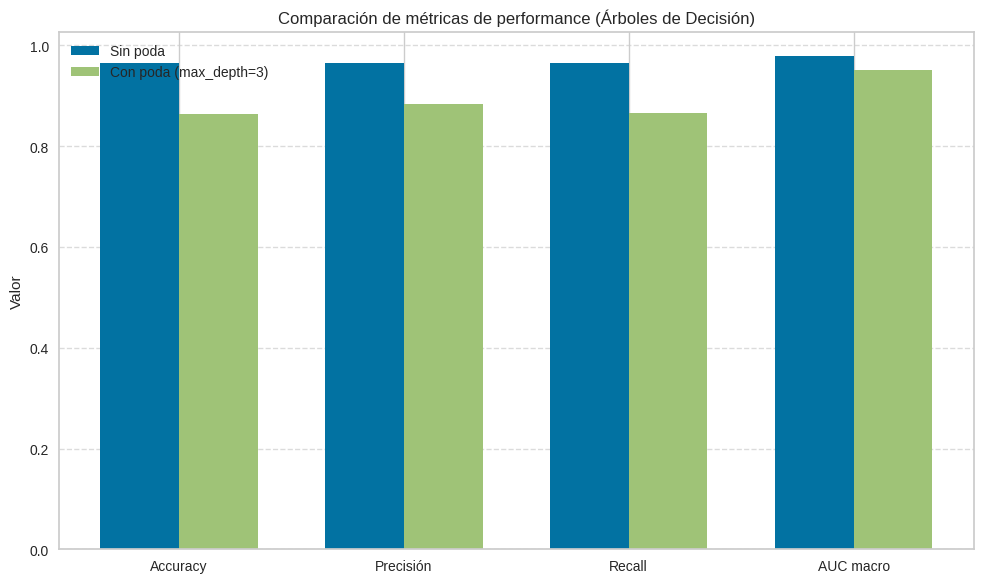

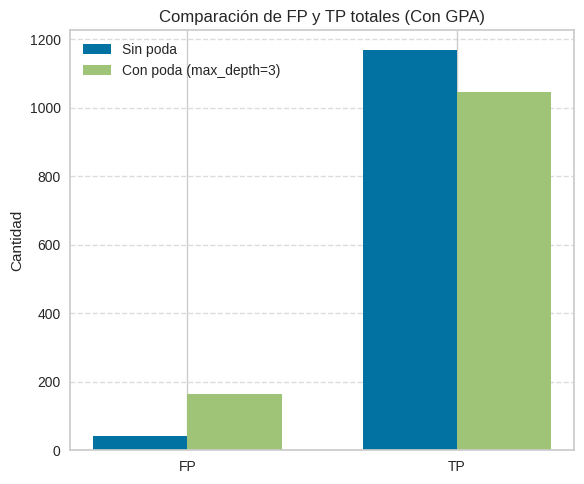

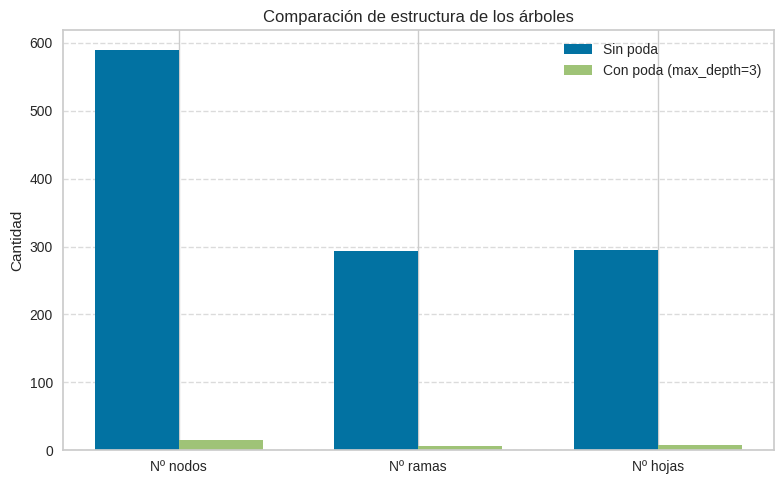

/tmp/ipykernel_144403/291906441.py:96: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([metrics_full['ejemplos_por_hoja'], metrics_pruned['ejemplos_por_hoja']],


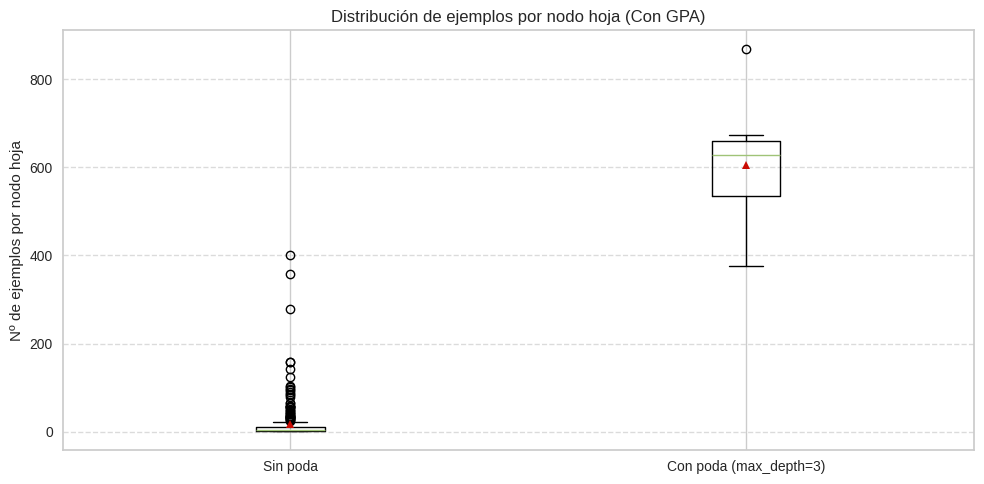

In [85]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize

# Métricas para ambos árboles
def obtener_metricas(y_val, y_pred, y_prob, modelo):
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred, average='macro')
    recall = recall_score(y_val, y_pred, average='macro')
    cm = confusion_matrix(y_val, y_pred)
    FP = cm.sum(axis=0) - np.diag(cm)
    TP = np.diag(cm)
    y_val_bin = label_binarize(y_val, classes=sorted(set(y)))
    aucs = [roc_auc_score(y_val_bin[:, i], y_prob[:, i]) for i in range(y_prob.shape[1])]
    auc_macro = np.mean(aucs)
    n_nodos = modelo.tree_.node_count
    n_hojas = sum(modelo.tree_.children_left == -1)
    n_ramas = n_nodos - n_hojas
    muestras_por_hoja = modelo.tree_.n_node_samples[modelo.tree_.children_left == -1]
    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'FP': FP.sum(),
        'TP': TP.sum(),
        'auc_macro': auc_macro,
        'n_nodos': n_nodos,
        'n_ramas': n_ramas,
        'n_hojas': n_hojas,
        'ejemplos_por_hoja': muestras_por_hoja
    }

metrics_full = obtener_metricas(y_val, y_pred_full, y_prob_full, tree_full)
metrics_pruned = obtener_metricas(y_val, y_pred_pruned, y_prob_pruned, tree_pruned)

import numpy as np
import matplotlib.pyplot as plt

# Comparar métricas en gráficos (sin FP y TP)
labels = ['Accuracy', 'Precisión', 'Recall', 'AUC macro']
full_values = [metrics_full['accuracy'], metrics_full['precision'], metrics_full['recall'], metrics_full['auc_macro']]
pruned_values = [metrics_pruned['accuracy'], metrics_pruned['precision'], metrics_pruned['recall'], metrics_pruned['auc_macro']]

x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x - width/2, full_values, width, label='Sin poda')
plt.bar(x + width/2, pruned_values, width, label='Con poda (max_depth=3)')
plt.xticks(x, labels)
plt.ylabel('Valor')
plt.title('Comparación de métricas de performance (Árboles de Decisión)')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# FP y TP en gráfico separado
labels_fp_tp = ['FP', 'TP']
full_fp_tp = [metrics_full['FP'], metrics_full['TP']]
pruned_fp_tp = [metrics_pruned['FP'], metrics_pruned['TP']]

x_fp_tp = np.arange(len(labels_fp_tp))

plt.figure(figsize=(6, 5))
plt.bar(x_fp_tp - width/2, full_fp_tp, width, label='Sin poda')
plt.bar(x_fp_tp + width/2, pruned_fp_tp, width, label='Con poda (max_depth=3)')
plt.xticks(x_fp_tp, labels_fp_tp)
plt.ylabel('Cantidad')
plt.title('Comparación de FP y TP totales (Con GPA)')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Comparar estructura del árbol
labels_tree = ['Nº nodos', 'Nº ramas', 'Nº hojas']
full_tree = [metrics_full['n_nodos'], metrics_full['n_ramas'], metrics_full['n_hojas']]
pruned_tree = [metrics_pruned['n_nodos'], metrics_pruned['n_ramas'], metrics_pruned['n_hojas']]

x2 = np.arange(len(labels_tree))
plt.figure(figsize=(8, 5))
plt.bar(x2 - width/2, full_tree, width, label='Sin poda')
plt.bar(x2 + width/2, pruned_tree, width, label='Con poda (max_depth=3)')
plt.xticks(x2, labels_tree)
plt.ylabel('Cantidad')
plt.title('Comparación de estructura de los árboles')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Comparar ejemplos por nodo hoja
plt.figure(figsize=(10, 5))
plt.boxplot([metrics_full['ejemplos_por_hoja'], metrics_pruned['ejemplos_por_hoja']],
            labels=['Sin poda', 'Con poda (max_depth=3)'], showmeans=True)
plt.ylabel('Nº de ejemplos por nodo hoja')
plt.title('Distribución de ejemplos por nodo hoja (Con GPA)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Random Forest

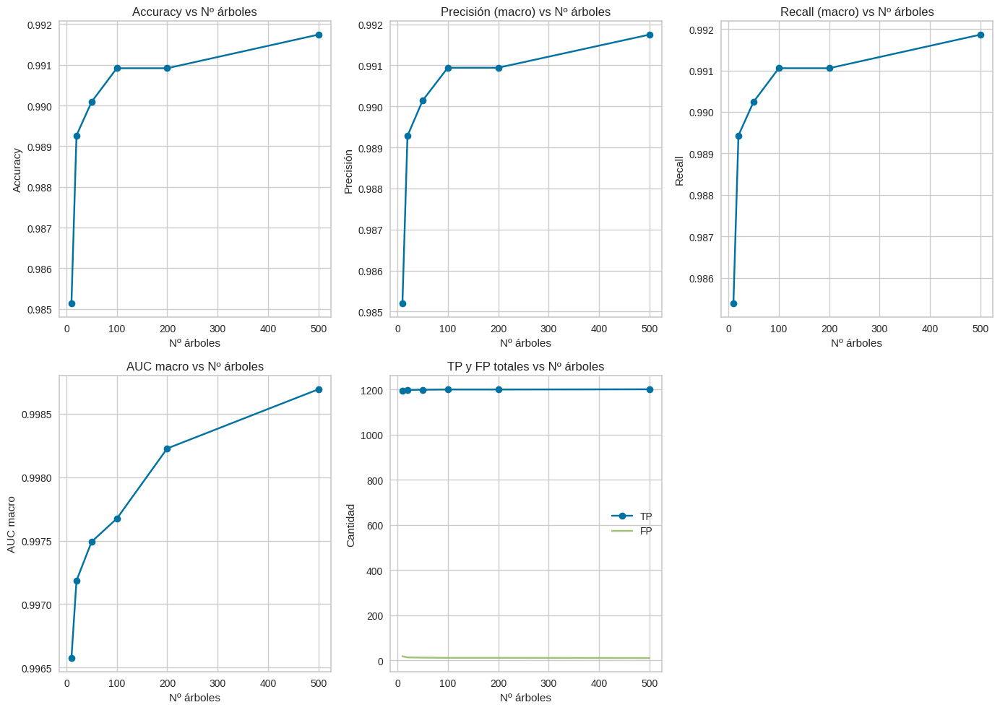

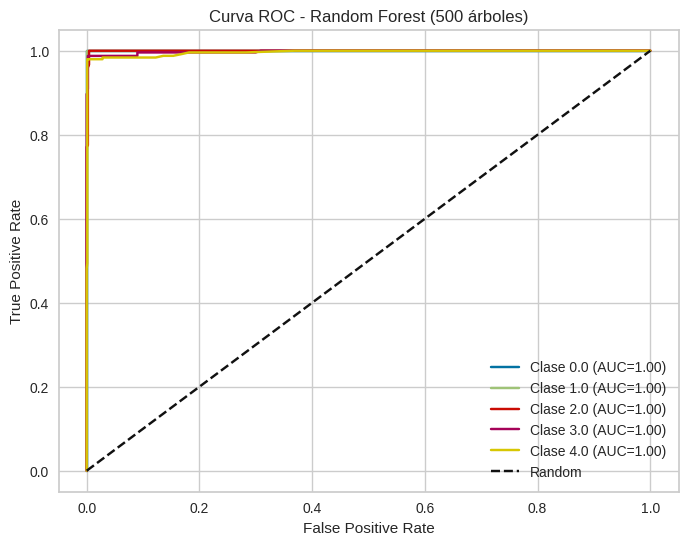

In [86]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split

# Separar los datos (ya escalados y balanceados)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

n_trees_list = [10, 20, 50, 100, 200, 500]
accuracy_list = []
precision_list = []
recall_list = []
auc_macro_list = []
fp_list = []
tp_list = []

# Para ROC
roc_curves = {}

for n_trees in n_trees_list:
    rf_model = RandomForestClassifier(n_estimators=n_trees, random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred = rf_model.predict(X_val)
    y_prob = rf_model.predict_proba(X_val)
    y_val_bin = label_binarize(y_val, classes=sorted(set(y)))
    
    # Accuracy, precision, recall
    accuracy_list.append(accuracy_score(y_val, y_pred))
    precision_list.append(precision_score(y_val, y_pred, average='macro'))
    recall_list.append(recall_score(y_val, y_pred, average='macro'))
    
    # AUC macro
    aucs = [roc_auc_score(y_val_bin[:, i], y_prob[:, i]) for i in range(y_prob.shape[1])]
    auc_macro_list.append(np.mean(aucs))
    
    # FP y TP totales
    cm = confusion_matrix(y_val, y_pred)
    FP = cm.sum(axis=0) - np.diag(cm)
    TP = np.diag(cm)
    fp_list.append(FP.sum())
    tp_list.append(TP.sum())
    
    # Guardar curvas ROC para el último modelo
    if n_trees == n_trees_list[-1]:
        roc_curves = {}
        for i, clase in enumerate(sorted(set(y))):
            fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_prob[:, i])
            roc_curves[clase] = (fpr, tpr, aucs[i])

# Gráficos de barras/líneas para comparar
plt.figure(figsize=(14, 10))

plt.subplot(2, 3, 1)
plt.plot(n_trees_list, accuracy_list, marker='o')
plt.title('Accuracy vs Nº árboles')
plt.xlabel('Nº árboles')
plt.ylabel('Accuracy')
plt.grid(True)

plt.subplot(2, 3, 2)
plt.plot(n_trees_list, precision_list, marker='o')
plt.title('Precisión (macro) vs Nº árboles')
plt.xlabel('Nº árboles')
plt.ylabel('Precisión')
plt.grid(True)

plt.subplot(2, 3, 3)
plt.plot(n_trees_list, recall_list, marker='o')
plt.title('Recall (macro) vs Nº árboles')
plt.xlabel('Nº árboles')
plt.ylabel('Recall')
plt.grid(True)

plt.subplot(2, 3, 4)
plt.plot(n_trees_list, auc_macro_list, marker='o')
plt.title('AUC macro vs Nº árboles')
plt.xlabel('Nº árboles')
plt.ylabel('AUC macro')
plt.grid(True)

plt.subplot(2, 3, 5)
plt.plot(n_trees_list, tp_list, marker='o', label='TP')
plt.plot(n_trees_list, fp_list, marker='x', label='FP')
plt.title('TP y FP totales vs Nº árboles')
plt.xlabel('Nº árboles')
plt.ylabel('Cantidad')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Curvas ROC para el modelo con más árboles
plt.figure(figsize=(8, 6))
for clase, (fpr, tpr, auc_score) in roc_curves.items():
    plt.plot(fpr, tpr, label=f'Clase {clase} (AUC={auc_score:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'Curva ROC - Random Forest ({n_trees_list[-1]} árboles)')
plt.legend(loc='lower right')
plt.show()

## Comparacion de metricas

/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be drop

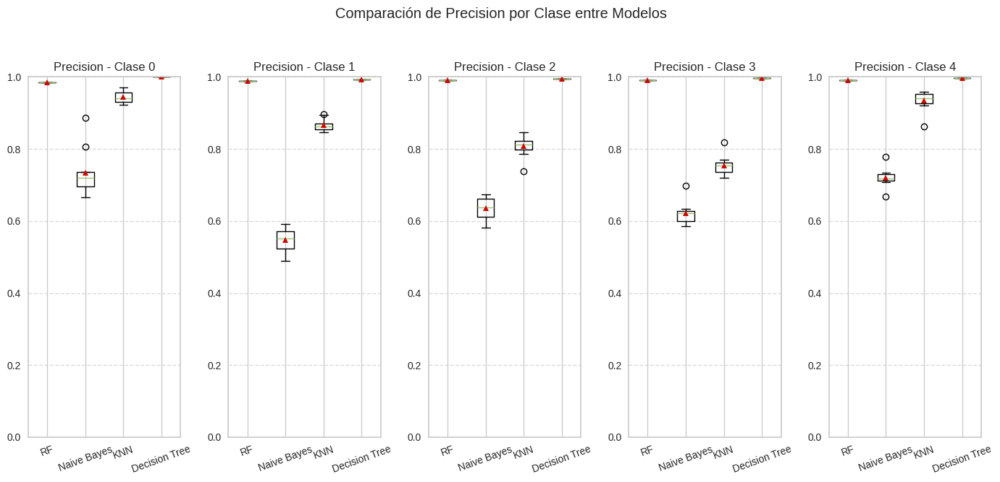

/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be drop

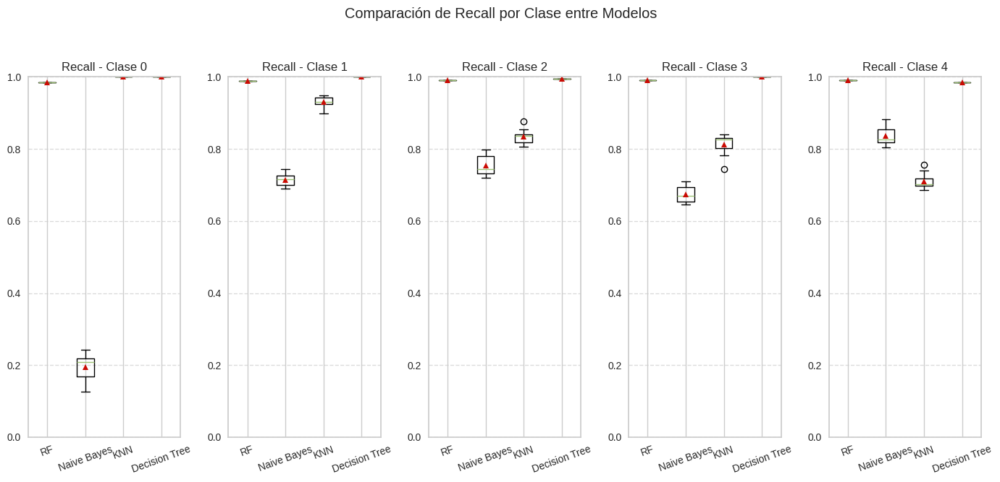

/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_box, showmeans=True, labels=labels_box)
/tmp/ipykernel_144403/2776561399.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be drop

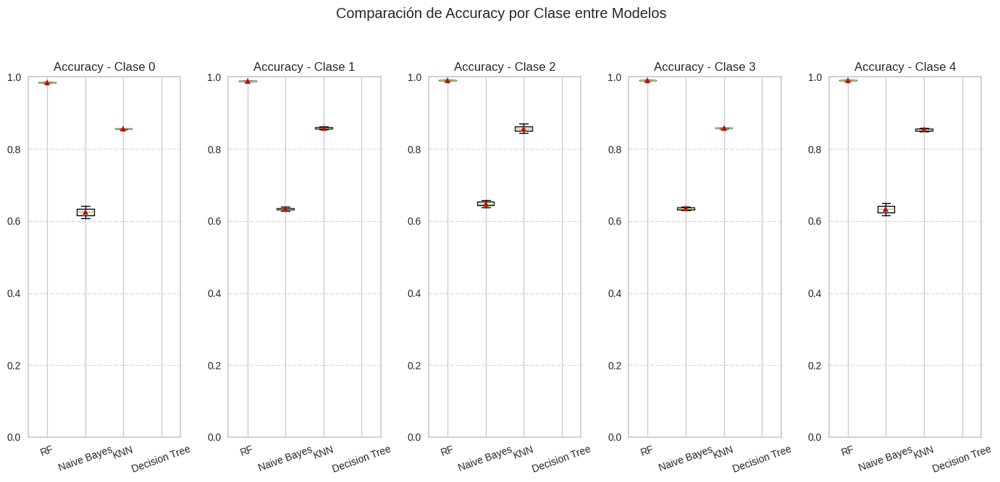

In [87]:
# Comparar las métricas de los 3 modelos (Naive Bayes, KNN, Decision Tree) en boxplot por clase

metricas_modelos = {
    'RF': {
        'Precision': precision_list,
        'Recall': recall_list,
        'Accuracy': accuracy_list
    },
    'KNN': {
        'Precision': precision_list_knn,
        'Recall': recall_list_knn,
        'Accuracy': accuracy_list_knn
    },
    'Decision Tree': {
        'Precision': precision_list_tree,
        'Recall': recall_list_tree,
        'Accuracy': accuracy_list_tree
    }
    ,
    'Naive Bayes': {
        'Precision': precision_list_NB,
        'Recall': recall_list_NB,
        'Accuracy': accuracy_list_NB
    }
}


metricas_a_comparar = ['Precision', 'Recall', 'Accuracy']
modelos = ['RF', 'Naive Bayes', 'KNN', 'Decision Tree']
clases = [0.0, 1.0, 2.0, 3.0, 4.0]

for metrica in metricas_a_comparar:
    plt.figure(figsize=(14, 7))
    for idx, clase in enumerate(clases):
        data_box = []
        labels_box = []
        for modelo in modelos:
            valores = metricas_modelos[modelo][metrica]
            n_iter = int(len(valores) / len(clases))
            # Extrae los valores de la clase correspondiente en cada iteración
            valores_clase = [valores[j * len(clases) + idx] for j in range(n_iter)]
            data_box.append(valores_clase)
            labels_box.append(modelo)
        plt.subplot(1, len(clases), idx + 1)
        plt.boxplot(data_box, showmeans=True, labels=labels_box)
        plt.title(f'{metrica} - Clase {int(clase)}')
        plt.ylim(0, 1)
        plt.xticks(rotation=20)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.suptitle(f'Comparación de {metrica} por Clase entre Modelos')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


## Clustering

Comparación de métricas para KMeans:
Clusters=4 | Silhouette: 0.1114 | Davies-Bouldin: 2.4947 | Calinski-Harabasz: 548.03
Clusters=5 | Silhouette: 0.0980 | Davies-Bouldin: 2.4409 | Calinski-Harabasz: 464.96


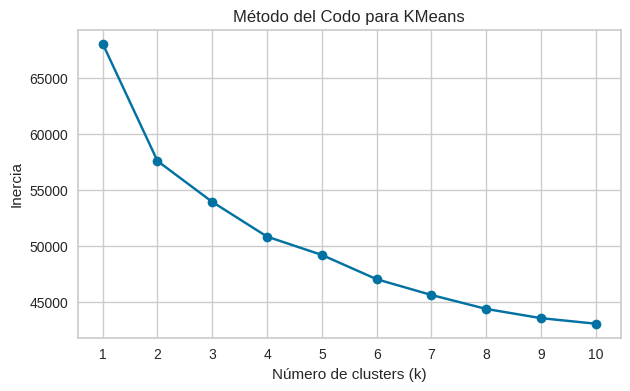

In [88]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Usar X ya escalado y sin columnas 'StudentID' ni 'GradeClass'
# Si ya tienes X_train, úsalo. Si no, usa X directamente.
# Aquí se asume que X_train ya está definido (como en el flujo del proyecto).

# KMeans con 4 clusters
kmeans_4 = KMeans(n_clusters=4, n_init=10, random_state=42)
labels_4 = kmeans_4.fit_predict(X_train)
silhouette_4 = silhouette_score(X_train, labels_4)
db_4 = davies_bouldin_score(X_train, labels_4)
calinski_4 = calinski_harabasz_score(X_train, labels_4)

# KMeans con 5 clusters
kmeans_5 = KMeans(n_clusters=5, n_init=10, random_state=42)
labels_5 = kmeans_5.fit_predict(X_train)
silhouette_5 = silhouette_score(X_train, labels_5)
db_5 = davies_bouldin_score(X_train, labels_5)
calinski_5 = calinski_harabasz_score(X_train, labels_5)

print("Comparación de métricas para KMeans:")
print(f"Clusters=4 | Silhouette: {silhouette_4:.4f} | Davies-Bouldin: {db_4:.4f} | Calinski-Harabasz: {calinski_4:.2f}")
print(f"Clusters=5 | Silhouette: {silhouette_5:.4f} | Davies-Bouldin: {db_5:.4f} | Calinski-Harabasz: {calinski_5:.2f}")

# Puedes elegir el número de clusters que prefieras para análisis posterior
cluster_labels = labels_5  # o labels_2

# Método del codo para determinar el número óptimo de clusters
inertia = []
K = range(1, 11)
for k in K:
    kmeans_k = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans_k.fit(X_train)
    inertia.append(kmeans_k.inertia_)

plt.figure(figsize=(7, 4))
plt.plot(K, inertia, marker='o')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia')
plt.title('Método del Codo para KMeans')
plt.xticks(K)
plt.grid(True)
plt.show()